<br></br>
<h3>Surfing the Waves of Data: Web Traffic Analysis and Anomaly Detection</h3>

<h3>Introduction:</h3>

<p>The project, "Surfing the Waves of Data: Web Traffic Analysis and Anomaly Detection," is based on a Kaggle competition that challenges participants to forecast future web traffic for approximately 145,000 Wikipedia articles. The competition addresses a real-world problem of predicting the future values of multiple time series. Web traffic forecasting is crucial because it has applications in many areas like resource planning and content delivery optimization.

The project involves analyzing web traffic data and predicting future trends by employing state-of-the-art methods. Key steps include data preprocessing, feature engineering, and applying machine learning models, such as LSTMs, to predict future visits. Additionally, the project explores anomaly detection techniques to identify unusual patterns in the web traffic data, which could be indicative of significant events or errors.

To summarize, this project aims to provide insights into predicting and understanding web traffic behavior by leveraging advanced machine learning techniques. The solution involves comprehensive data analysis, feature selection, and model building to forecast future web traffic trends effectively.</p>

In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('whitegrid')
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.style as style
from sklearn.metrics import mean_squared_error
style.use('fivethirtyeight')
sns.set_style('whitegrid')
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [10]:
df = pd.read_csv('./Datasets/train_1.csv', parse_dates = True)

In [11]:
df.head()

,Page,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,...,12/22/2016,12/23/2016,12/24/2016,12/25/2016,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,15.0,16.0,12.0,20.0,12.0,25.0,25.0,25.0,25.0,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [12]:
df.shape

(145063, 551)

In [13]:
df.isnull().sum()

Page              0
7/1/2015      20739
7/2/2015      20815
7/3/2015      20543
7/4/2015      20653
              ...  
12/27/2016     3701
12/28/2016     3822
12/29/2016     3826
12/30/2016     3635
12/31/2016     3465
Length: 551, dtype: int64

In [14]:
df_long = pd.melt(df, id_vars=['Page'], var_name='Date', value_name='Visits')

In [15]:
df_long.head()

,Page,Date,Visits
0,2NE1_zh.wikipedia.org_all-access_spider,7/1/2015,18.0
1,2PM_zh.wikipedia.org_all-access_spider,7/1/2015,11.0
2,3C_zh.wikipedia.org_all-access_spider,7/1/2015,1.0
3,4minute_zh.wikipedia.org_all-access_spider,7/1/2015,35.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,7/1/2015,15.0


In [16]:
df_long["Date"].value_counts()

7/1/2015      145063
7/4/2016      145063
6/28/2016     145063
6/29/2016     145063
6/30/2016     145063
               ...  
12/25/2015    145063
12/24/2015    145063
12/23/2015    145063
12/22/2015    145063
12/31/2016    145063
Name: Date, Length: 550, dtype: int64

In [ ]:
# 400 * 550

# 300*550 100*550 100*550

In [9]:
df_long.isnull().sum()

Page            0
Date            0
Visits    6192640
dtype: int64

In [17]:
df_long['Visits'] = df_long['Visits'].fillna(0)

In [18]:
df_long['Date'] = pd.to_datetime(df_long['Date'])

In [19]:
df_long.isnull().sum()

Page      0
Date      0
Visits    0
dtype: int64

In [ ]:
# daily_hits = df_long.groupby('Date')['Visits'].sum()

In [ ]:
# daily_hits

In [ ]:
# plt.figure(figsize=(30, 10))
# daily_hits.plot()
# plt.title('Daily Hits Over Time')
# plt.xlabel('Date')
# plt.ylabel('Number of Hits')
# plt.grid(True)
# plt.show()

In [20]:
df_long['Year'] = df_long['Date'].dt.year
df_long['Month'] = df_long['Date'].dt.month
df_long['Day'] = df_long['Date'].dt.day

In [21]:
df_long.head()

,Page,Date,Visits,Year,Month,Day
0,2NE1_zh.wikipedia.org_all-access_spider,2015-07-01,18.0,2015,7,1
1,2PM_zh.wikipedia.org_all-access_spider,2015-07-01,11.0,2015,7,1
2,3C_zh.wikipedia.org_all-access_spider,2015-07-01,1.0,2015,7,1
3,4minute_zh.wikipedia.org_all-access_spider,2015-07-01,35.0,2015,7,1
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,2015-07-01,15.0,2015,7,1


In [22]:
daily_visits = df_long[['Date', 'Visits', 'Page']].groupby(['Date'])['Visits'].mean()

In [23]:
print(daily_visits)

Date
2015-07-01    1024.882230
2015-07-02    1031.233712
2015-07-03     973.123470
2015-07-04    1003.791160
2015-07-05    1044.342003
                 ...     
2016-12-27    1635.483266
2016-12-28    1590.915230
2016-12-29    1639.884526
2016-12-30    1431.159538
2016-12-31    1442.971633
Name: Visits, Length: 550, dtype: float64


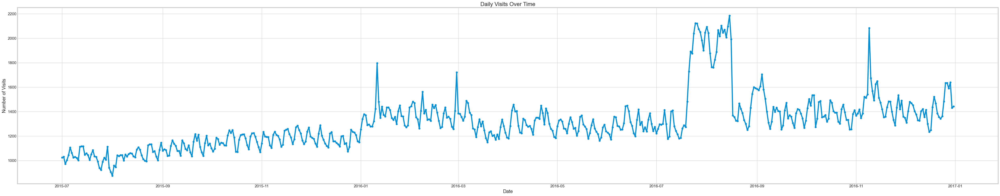

In [17]:
plt.figure(figsize=(50, 10))
plt.plot(daily_visits.index, daily_visits, marker='o', linestyle='-')
plt.title('Daily Visits Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Visits')
plt.grid(True)
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()

In [24]:
Monthly_visits = df_long[['Month', 'Visits', 'Page']].groupby(['Month'])['Visits'].mean()

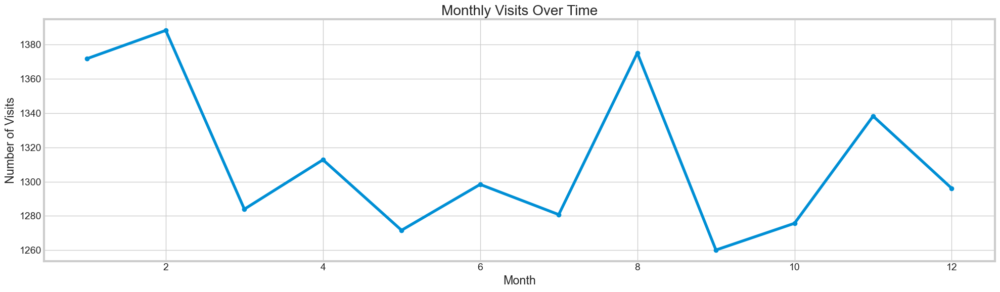

In [19]:
#Let's plot visits by month

plt.figure(figsize=(20, 6))
plt.plot(Monthly_visits.index, Monthly_visits, marker='o', linestyle='-')
plt.title('Monthly Visits Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Visits')
plt.grid(True)
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()

In [25]:
Day_visits = df_long[['Day', 'Visits', 'Page']].groupby(['Day'])['Visits'].mean()

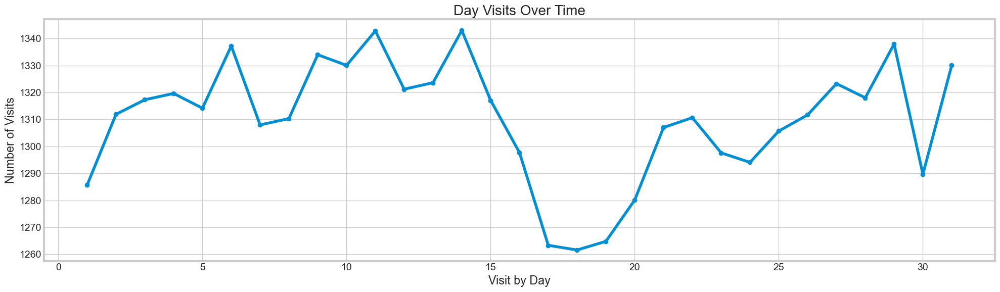

In [21]:
#Let's plot visits by Day

plt.figure(figsize=(20, 6))
plt.plot(Day_visits.index, Day_visits, marker='o', linestyle='-')
plt.title('Day Visits Over Time')
plt.xlabel('Visit by Day')
plt.ylabel('Number of Visits')
plt.grid(True)
plt.tight_layout()  # Adjust layout to make room for label rotation
plt.show()

In [22]:
page_visits = df_long[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
page_visit = pd.DataFrame({'Page':page_visits.index, 'Visits':list(page_visits)})

In [23]:
page_visit

,Page,Visits
0,Main_Page_en.wikipedia.org_all-access_all-agents,1.206618e+10
1,Main_Page_en.wikipedia.org_desktop_all-agents,8.774497e+09
2,Main_Page_en.wikipedia.org_mobile-web_all-agents,3.153985e+09
3,Wikipedia:Hauptseite_de.wikipedia.org_all-acce...,1.603934e+09
4,Special:Search_en.wikipedia.org_all-access_all...,1.304079e+09
...,...,...
145058,Developer_Wishlist/2017/Developer_Environment_...,0.000000e+00
145059,Пятьдесят_оттенков_свободы_(фильм)_ru.wikipedi...,0.000000e+00
145060,Developer_Wishlist/2017/Developer_Environment_...,0.000000e+00
145061,Developer_Wishlist/2017/Documentation_www.medi...,0.000000e+00


In [24]:
name = []
for page in page_visit['Page']:
    split = page.split('.')
    name.append(split[-3])

In [25]:
name

['Main_Page_en',
 'Main_Page_en',
 'Main_Page_en',
 'Wikipedia:Hauptseite_de',
 'Special:Search_en',
 'Wikipedia:Hauptseite_de',
 'Заглавная_страница_ru',
 'Special:Search_en',
 'Wikipédia:Accueil_principal_fr',
 'Wikipedia:Portada_es',
 'Заглавная_страница_ru',
 'Wikipédia:Accueil_principal_fr',
 'Wikipedia:Portada_es',
 'Wikipedia:Hauptseite_de',
 'Заглавная_страница_ru',
 'Special:Search_en',
 'Wikipédia:Accueil_principal_fr',
 'Spezial:Suche_de',
 'Spezial:Suche_de',
 'メインページ_ja',
 'Especial:Buscar_es',
 'Wikipedia:Portada_es',
 'Especial:Buscar_es',
 'メインページ_ja',
 'Special:Book_en',
 'Special:Book_en',
 'Main_Page_en',
 'Special:Search_en',
 'Wikipedia:首页_zh',
 'Служебная:Поиск_ru',
 'Служебная:Поиск_ru',
 'Spécial:Recherche_fr',
 'php_en',
 'php_en',
 'Donald_Trump_en',
 'Spécial:Recherche_fr',
 'Sp?cial:Search_fr',
 'Sp?cial:Search_fr',
 'XHamster_en',
 '特別:検索_ja',
 '特別:検索_ja',
 'XHamster_en',
 'Special:Search_commons',
 'メインページ_ja',
 'Wikipedia:首页_zh',
 'Special:RecentChanges_e

In [26]:
page_visit['Name'] = name
page_visit['Language'] = page_visit['Name'].str[-2:]

In [27]:
page_visit

,Page,Visits,Name,Language
0,Main_Page_en.wikipedia.org_all-access_all-agents,1.206618e+10,Main_Page_en,en
1,Main_Page_en.wikipedia.org_desktop_all-agents,8.774497e+09,Main_Page_en,en
2,Main_Page_en.wikipedia.org_mobile-web_all-agents,3.153985e+09,Main_Page_en,en
3,Wikipedia:Hauptseite_de.wikipedia.org_all-acce...,1.603934e+09,Wikipedia:Hauptseite_de,de
4,Special:Search_en.wikipedia.org_all-access_all...,1.304079e+09,Special:Search_en,en
...,...,...,...,...
145058,Developer_Wishlist/2017/Developer_Environment_...,0.000000e+00,Developer_Wishlist/2017/Developer_Environment_www,ww
145059,Пятьдесят_оттенков_свободы_(фильм)_ru.wikipedi...,0.000000e+00,Пятьдесят_оттенков_свободы_(фильм)_ru,ru
145060,Developer_Wishlist/2017/Developer_Environment_...,0.000000e+00,Developer_Wishlist/2017/Developer_Environment_www,ww
145061,Developer_Wishlist/2017/Documentation_www.medi...,0.000000e+00,Developer_Wishlist/2017/Documentation_www,ww


In [28]:
plt.figure(figsize = (10,7))
top_visits = page_visit.iloc[:10]
top_visits

,Page,Visits,Name,Language
0,Main_Page_en.wikipedia.org_all-access_all-agents,1.206618e+10,Main_Page_en,en
1,Main_Page_en.wikipedia.org_desktop_all-agents,8.774497e+09,Main_Page_en,en
2,Main_Page_en.wikipedia.org_mobile-web_all-agents,3.153985e+09,Main_Page_en,en
3,Wikipedia:Hauptseite_de.wikipedia.org_all-acce...,1.603934e+09,Wikipedia:Hauptseite_de,de
4,Special:Search_en.wikipedia.org_all-access_all...,1.304079e+09,Special:Search_en,en
5,Wikipedia:Hauptseite_de.wikipedia.org_mobile-w...,1.112689e+09,Wikipedia:Hauptseite_de,de
6,Заглавная_страница_ru.wikipedia.org_all-access...,1.086019e+09,Заглавная_страница_ru,ru
7,Special:Search_en.wikipedia.org_desktop_all-ag...,1.011848e+09,Special:Search_en,en
8,Wikipédia:Accueil_principal_fr.wikipedia.org_a...,8.684807e+08,Wikipédia:Accueil_principal_fr,fr
9,Wikipedia:Portada_es.wikipedia.org_all-access_...,7.514923e+08,Wikipedia:Portada_es,es


<Figure size 1000x700 with 0 Axes>

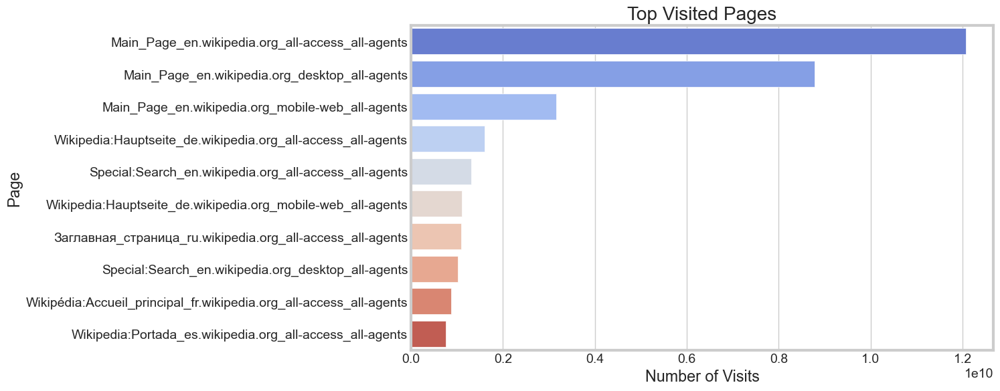

In [29]:
plt.figure(figsize=(10, 6))
sns.barplot(data=top_visits, y='Page', x='Visits', palette='coolwarm')
plt.title('Top Visited Pages')
plt.xlabel('Number of Visits')
plt.ylabel('Page')
plt.show()

In [26]:
name = []
project = []
access_agent = []

for page in df['Page']:
    split = page.split('.')
    name.append(split[-3])
    project.append(split[-2])
    access_agent.append(split[-1])

In [27]:
df['Name'] = name
df['Project'] = project
df['access_agent'] = access_agent
df['Language'] = df['Name'].str[-2:]

In [32]:
df.head()

,Page,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,...,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016,Name,Project,access_agent,Language
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,14.0,20.0,22.0,19.0,18.0,20.0,2NE1_zh,wikipedia,org_all-access_spider,zh
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,9.0,30.0,52.0,45.0,26.0,20.0,2PM_zh,wikipedia,org_all-access_spider,zh
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,4.0,4.0,6.0,3.0,4.0,17.0,3C_zh,wikipedia,org_all-access_spider,zh
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,16.0,11.0,17.0,19.0,10.0,11.0,4minute_zh,wikipedia,org_all-access_spider,zh
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,15.0,16.0,12.0,20.0,12.0,25.0,25.0,25.0,25.0,...,3.0,11.0,27.0,13.0,36.0,10.0,52_Hz_I_Love_You_zh,wikipedia,org_all-access_spider,zh


<AxesSubplot:xlabel='Project', ylabel='count'>

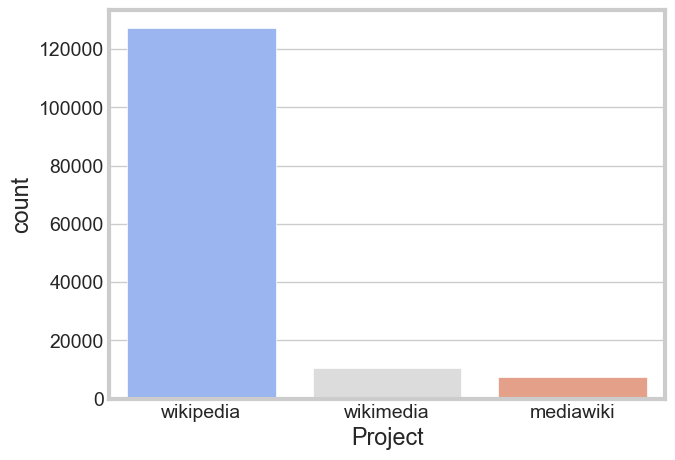

In [33]:
sns.countplot(df['Project'], palette = 'coolwarm')

<AxesSubplot:xlabel='access_agent', ylabel='count'>

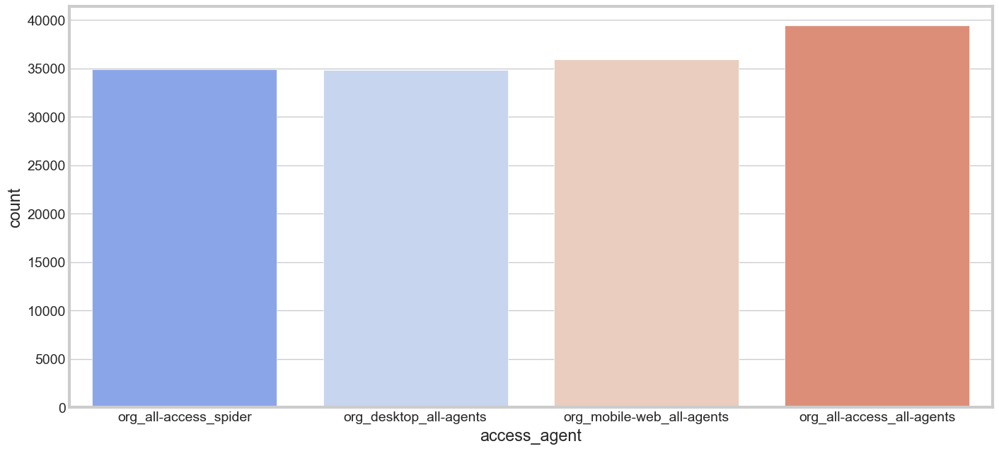

In [34]:
plt.figure(figsize = (15, 7))
sns.countplot(df['access_agent'], palette = 'coolwarm')

<AxesSubplot:xlabel='Language', ylabel='count'>

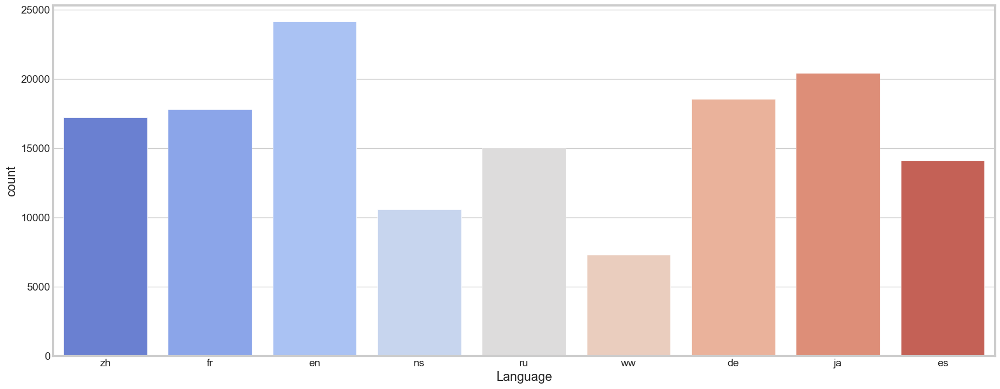

In [35]:
plt.figure(figsize = (20, 8))
sns.countplot(df['Language'], palette = 'coolwarm')

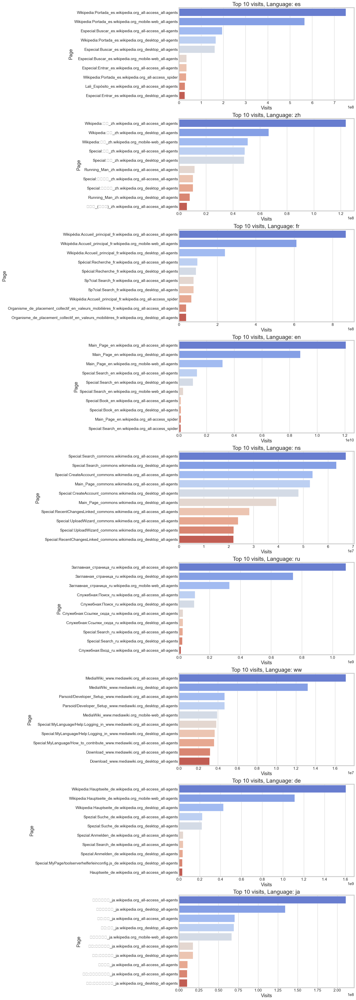

In [51]:
plt.figure(figsize=(10, 60))

remove_columns = ['Name', 'Project', 'access_agent', 'Language']
languages = ['es', 'zh', 'fr', 'en', 'ns', 'ru', 'ww', 'de', 'ja']

top = 10
c = 1

for lang in languages:
    
    df_lang = df[df['Language'] == lang]
    pv = df_lang.drop(remove_columns, axis=1)
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    visit_lang = pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
    visit_lang_df = pd.DataFrame({'Page':visit_lang.index, 'Visits':list(visit_lang)})
    
    # Plot the top visits
    top_visit = visit_lang_df.iloc[:top]
    plt.subplot(9, 1, c)
    title = f'Top {top} visits, Language: {lang}'
    sns.barplot(data=top_visit, y='Page', x='Visits', palette='coolwarm').set_title(title);
    
    c += 1

In [37]:
#Now let's see how visits trend for each language.

def visualize_visits(df, groupby, figsize, title, **kwargs):
    plt.figure(figsize=figsize)
    group_by = df[[groupby, 'Visits', 'Page']].groupby([groupby])['Visits'].mean()
    plt.plot(group_by, **kwargs)
    plt.title(title)
    plt.show()

In [28]:
en_df = df[df["Language"] == "en"]

In [29]:
en_df.reset_index(drop=True, inplace=True)

In [37]:
en_df["7/1/2015"].argmax()

11273

In [31]:
en_df.fillna(0, inplace = True)

In [43]:
en_df.drop(11273, inplace = True)

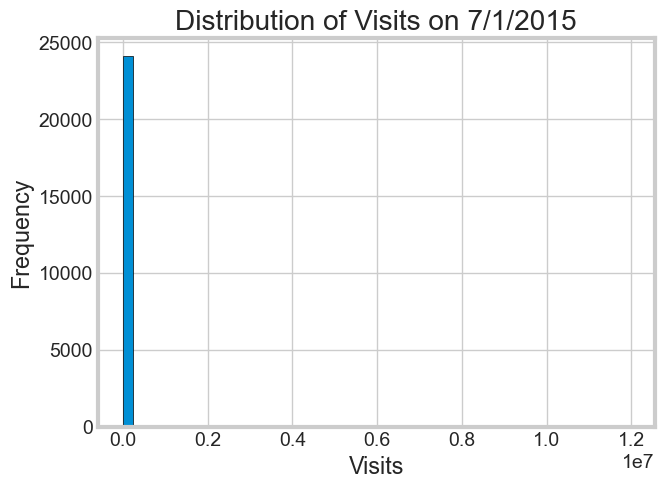

In [44]:
date_column = '7/1/2015'

visits = en_df[date_column]

plt.hist(visits, bins=50, edgecolor='black')
plt.xlabel('Visits')
plt.ylabel('Frequency')
plt.title(f'Distribution of Visits on {date_column}')
plt.show()

In [45]:
from collections import Counter

visit_counts = Counter(visits)

for visit_count, frequency in sorted(visit_counts.items()):
    print(f"{visit_count} visits: {frequency} pages")

0.0 visits: 3707 pages
1.0 visits: 666 pages
2.0 visits: 577 pages
3.0 visits: 437 pages
4.0 visits: 326 pages
5.0 visits: 259 pages
6.0 visits: 243 pages
7.0 visits: 248 pages
8.0 visits: 211 pages
9.0 visits: 154 pages
10.0 visits: 121 pages
11.0 visits: 143 pages
12.0 visits: 133 pages
13.0 visits: 112 pages
14.0 visits: 124 pages
15.0 visits: 104 pages
16.0 visits: 100 pages
17.0 visits: 92 pages
18.0 visits: 80 pages
19.0 visits: 77 pages
20.0 visits: 86 pages
21.0 visits: 66 pages
22.0 visits: 78 pages
23.0 visits: 81 pages
24.0 visits: 81 pages
25.0 visits: 80 pages
26.0 visits: 81 pages
27.0 visits: 86 pages
28.0 visits: 75 pages
29.0 visits: 83 pages
30.0 visits: 81 pages
31.0 visits: 67 pages
32.0 visits: 89 pages
33.0 visits: 79 pages
34.0 visits: 68 pages
35.0 visits: 84 pages
36.0 visits: 63 pages
37.0 visits: 71 pages
38.0 visits: 65 pages
39.0 visits: 76 pages
40.0 visits: 72 pages
41.0 visits: 57 pages
42.0 visits: 67 pages
43.0 visits: 72 pages
44.0 visits: 81 pages
45

In [46]:
mean_visits = visits.mean()
median_visits = visits.median()

In [47]:
print(mean_visits)
print(median_visits)

2668.5587173849917
103.0


In [49]:
en_df

,Page,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,...,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016,Name,Project,access_agent,Language
0,!vote_en.wikipedia.org_desktop_all-agents,3.0,4.0,7.0,4.0,4.0,2.0,3.0,7.0,2.0,...,1.0,1.0,3.0,3.0,1.0,0.0,!vote_en,wikipedia,org_desktop_all-agents,en
1,"""Awaken,_My_Love!""_en.wikipedia.org_desktop_al...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2074.0,2175.0,2156.0,2302.0,2098.0,1770.0,"""Awaken,_My_Love!""_en",wikipedia,org_desktop_all-agents,en
2,"""European_Society_for_Clinical_Investigation""_...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,2.0,"""European_Society_for_Clinical_Investigation""_en",wikipedia,org_desktop_all-agents,en
3,"""Weird_Al""_Yankovic_en.wikipedia.org_desktop_a...",2403.0,20136.0,1850.0,1432.0,1351.0,1792.0,1710.0,2039.0,1957.0,...,989.0,1332.0,1243.0,1681.0,1303.0,1098.0,"""Weird_Al""_Yankovic_en",wikipedia,org_desktop_all-agents,en
4,100_metres_en.wikipedia.org_desktop_all-agents,982.0,881.0,794.0,979.0,1191.0,1057.0,1184.0,860.0,1259.0,...,335.0,313.0,379.0,393.0,354.0,272.0,100_metres_en,wikipedia,org_desktop_all-agents,en
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24103,Zikanyrops_sparsa_en.wikipedia.org_all-access_...,1.0,5.0,2.0,2.0,0.0,1.0,0.0,0.0,2.0,...,0.0,0.0,1.0,0.0,0.0,2.0,Zikanyrops_sparsa_en,wikipedia,org_all-access_all-agents,en
24104,Zillur_Rahman_John_en.wikipedia.org_all-access...,7.0,9.0,3.0,6.0,4.0,2.0,6.0,7.0,6.0,...,6.0,0.0,7.0,4.0,5.0,7.0,Zillur_Rahman_John_en,wikipedia,org_all-access_all-agents,en
24105,Zitadelle_en.wikipedia.org_all-access_all-agents,10.0,6.0,4.0,8.0,13.0,5.0,9.0,5.0,4.0,...,8.0,1.0,5.0,7.0,10.0,3.0,Zitadelle_en,wikipedia,org_all-access_all-agents,en
24106,"Zovashen_(Dzhannatlu),_Ararat_en.wikipedia.org...",0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,2.0,7.0,3.0,6.0,4.0,4.0,"Zovashen_(Dzhannatlu),_Ararat_en",wikipedia,org_all-access_all-agents,en


In [52]:
pv_df = en_df.drop(remove_columns, axis=1)

In [53]:
pv_df.head()

,Page,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,...,12/22/2016,12/23/2016,12/24/2016,12/25/2016,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016
0,!vote_en.wikipedia.org_desktop_all-agents,3.0,4.0,7.0,4.0,4.0,2.0,3.0,7.0,2.0,...,3.0,1.0,6.0,3.0,1.0,1.0,3.0,3.0,1.0,0.0
1,"""Awaken,_My_Love!""_en.wikipedia.org_desktop_al...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2898.0,2676.0,2032.0,2294.0,2074.0,2175.0,2156.0,2302.0,2098.0,1770.0
2,"""European_Society_for_Clinical_Investigation""_...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0
3,"""Weird_Al""_Yankovic_en.wikipedia.org_desktop_a...",2403.0,20136.0,1850.0,1432.0,1351.0,1792.0,1710.0,2039.0,1957.0,...,1401.0,1238.0,976.0,810.0,989.0,1332.0,1243.0,1681.0,1303.0,1098.0
4,100_metres_en.wikipedia.org_desktop_all-agents,982.0,881.0,794.0,979.0,1191.0,1057.0,1184.0,860.0,1259.0,...,404.0,344.0,225.0,229.0,335.0,313.0,379.0,393.0,354.0,272.0


In [54]:
pivot_df = pv_df.melt(id_vars='Page', var_name='Date', value_name='Visits')

In [55]:
pivot_df

,Page,Date,Visits
0,!vote_en.wikipedia.org_desktop_all-agents,7/1/2015,3.0
1,"""Awaken,_My_Love!""_en.wikipedia.org_desktop_al...",7/1/2015,0.0
2,"""European_Society_for_Clinical_Investigation""_...",7/1/2015,0.0
3,"""Weird_Al""_Yankovic_en.wikipedia.org_desktop_a...",7/1/2015,2403.0
4,100_metres_en.wikipedia.org_desktop_all-agents,7/1/2015,982.0
...,...,...,...
13258845,Zikanyrops_sparsa_en.wikipedia.org_all-access_...,12/31/2016,2.0
13258846,Zillur_Rahman_John_en.wikipedia.org_all-access...,12/31/2016,7.0
13258847,Zitadelle_en.wikipedia.org_all-access_all-agents,12/31/2016,3.0
13258848,"Zovashen_(Dzhannatlu),_Ararat_en.wikipedia.org...",12/31/2016,4.0


In [56]:
pivot_df['Date'] = pd.to_datetime(pivot_df['Date'])

In [57]:
english_df = pivot_df[['Date', 'Visits', 'Page']].groupby(['Date'])['Visits'].mean()

In [68]:
english_df.to_csv('english_df.csv', index=False)

In [70]:
english_df.tail()

Date
2016-12-27    4924.368026
2016-12-28    4739.424773
2016-12-29    5163.799519
2016-12-30    4191.339362
2016-12-31    4043.401004
Name: Visits, dtype: float64

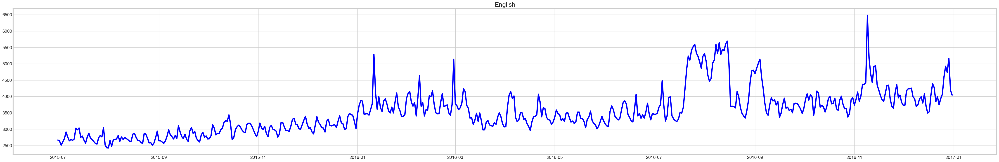

In [778]:
plt.figure(figsize = (50, 8))
plt.plot(english_df, color = 'blue')
plt.title('English')
plt.show()

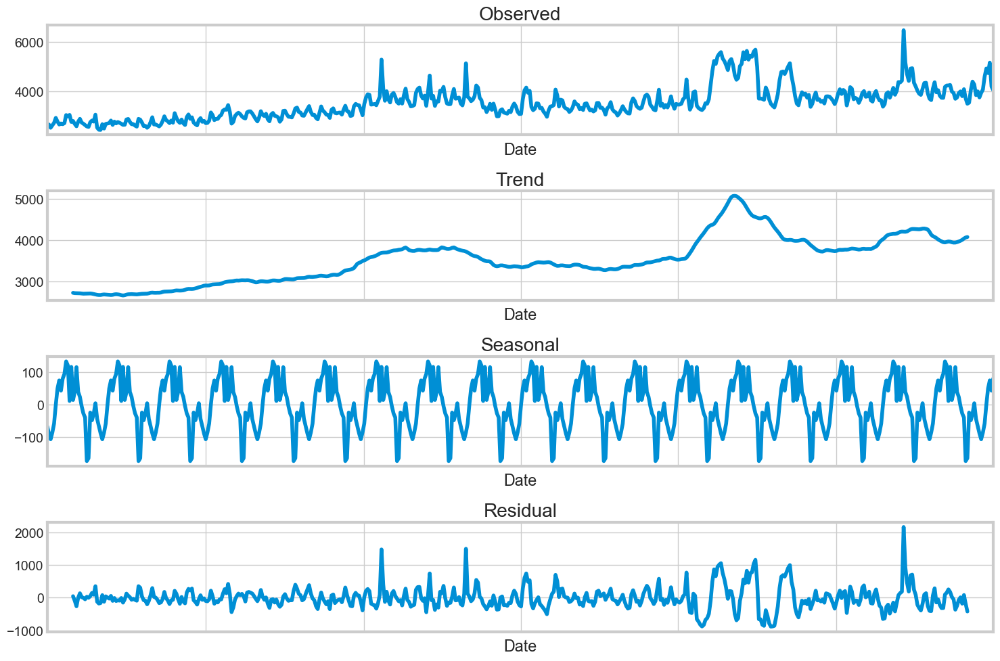

In [1038]:
#Seasonal Decomposition

from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(english_df, model='additive', period=30)

fig, axes = plt.subplots(4, 1, figsize=(15, 10))

decomposition.observed.plot(ax=axes[0], title='Observed')
decomposition.trend.plot(ax=axes[1], title='Trend')
decomposition.seasonal.plot(ax=axes[2], title='Seasonal')
decomposition.resid.plot(ax=axes[3], title='Residual')

for ax in axes:
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')  # Rotate labels

plt.tight_layout()
plt.show()

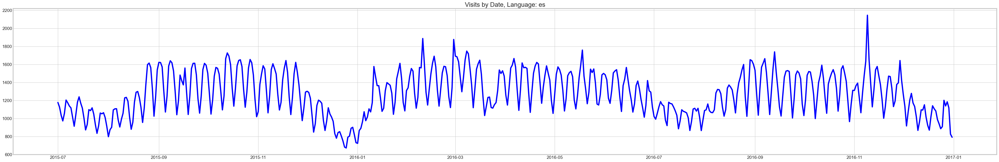

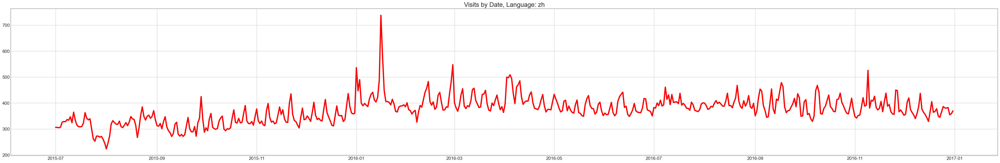

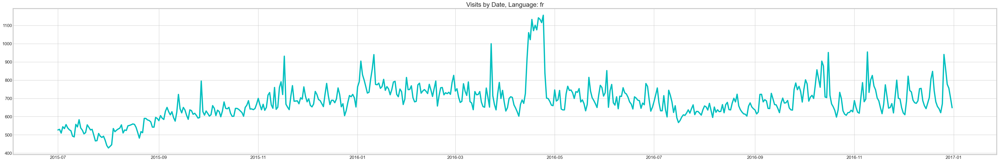

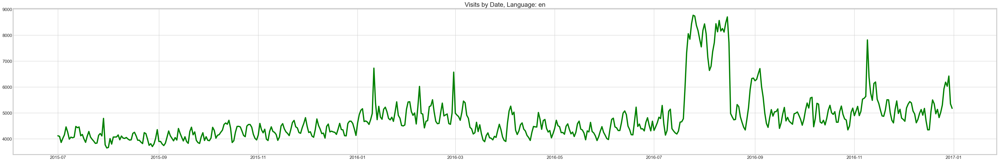

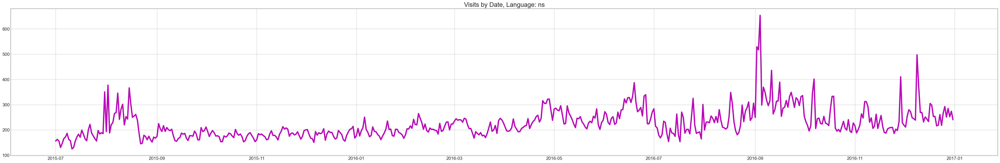

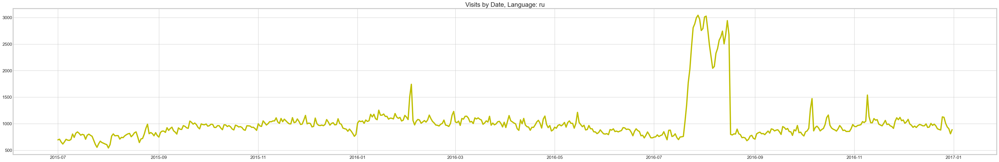

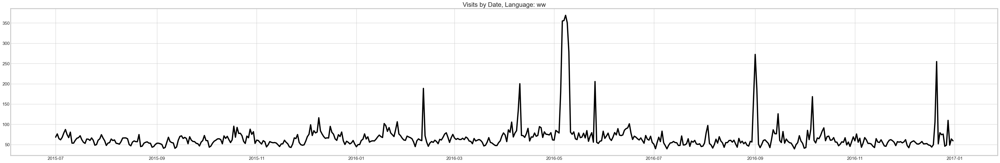

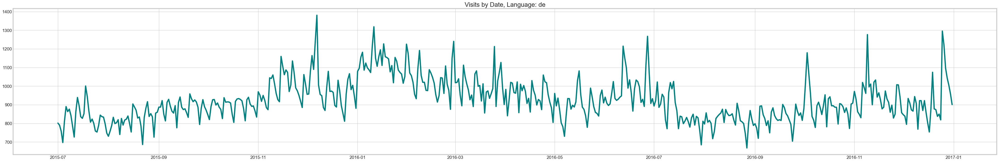

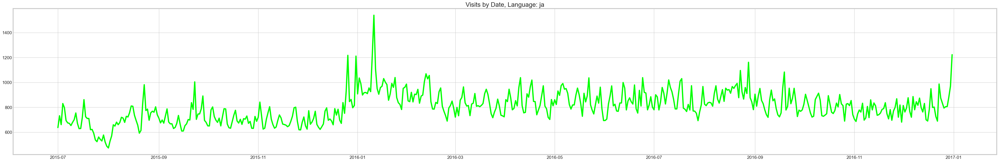

In [39]:
#Let's process the df, as we don't need some features in the df we can remove them. Transform the df too using melt.
color = ['b', 'r', 'c', 'g', 'm', 'y', 'k', 'teal', 'lime']
c = 0
for lang in languages:
    
    # create df
    data = df[df['Language'] == lang]
    pv = data.drop(remove_columns, axis=1) # Drop the columns which are not required
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    
    # Call the function for visualization
    visualize_visits(pivot, 'Date', (50, 8), title=f'Visits by Date, Language: {lang}', color=color[c])
    c += 1

<h4>Let's take a closer look at languages 'en' and 'ru'(english and russia) as the spike looking similar and seen in the same time period. Let's find out why and what is the cause for that higher visits.</h4>

<Figure size 1000x2000 with 0 Axes>

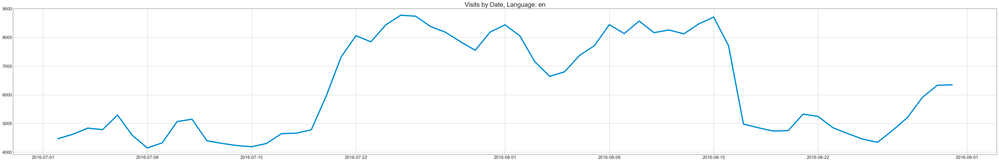

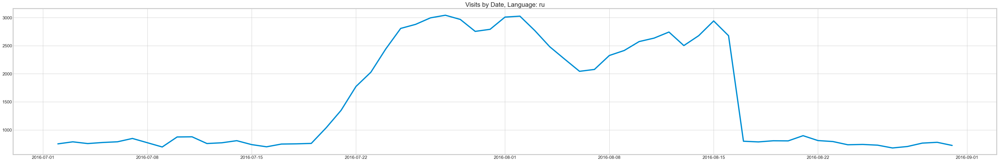

In [40]:
plt.figure(figsize=(10, 20))
top = 20
c = 1

for lang in ['en', 'ru']:
    data = df[df['Language'] == lang]
    pv = data.drop(remove_columns, axis=1) #Removing unncessary ccolumns
    
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits') #Transforming the data
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    
    #Let's take a closer look between dates '2016-07' and '2016-09' as the spike is high.
    pivot = pivot[(pivot['Date'] > '2016-07') & (pivot['Date'] < '2016-09')]

    
    visualize_visits(pivot, 'Date', (50, 8), title=f'Visits by Date, Language: {lang}')

<h3>Let's look at the pages which are most visited during this time period.</h3>

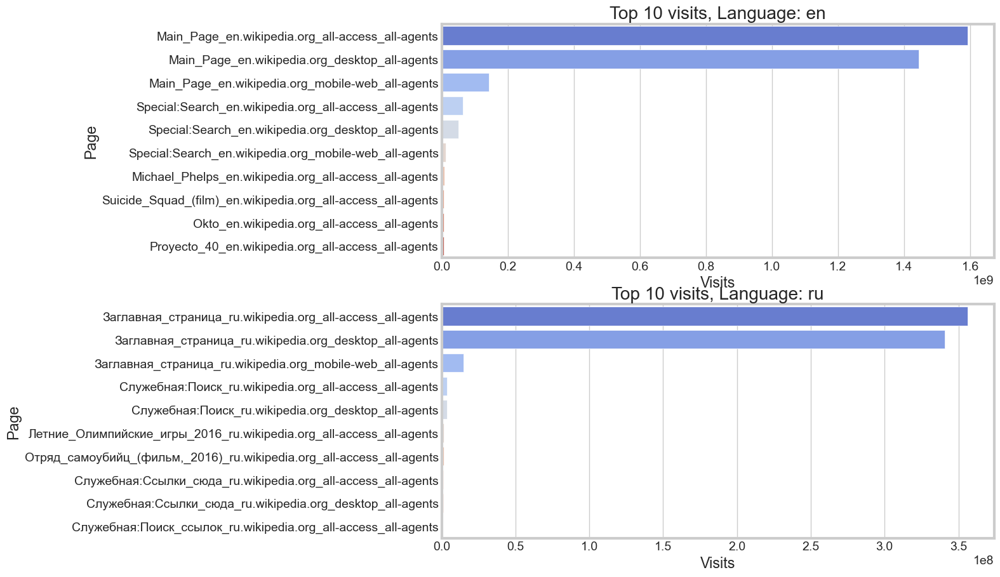

In [41]:
plt.figure(figsize = (10,10))
top = 10 #Let's see top 10 pages
c = 1

for lang in ['en', 'ru']:
    df_lang = df[df['Language'] == lang]
    pv = df_lang.drop(remove_columns, axis=1)
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    pivot = pivot[(pivot['Date'] > '2016-07-15') & (pivot['Date'] < '2016-08-15')]
    
    # Group the page and sum their visits
    visit_lang = pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
    visit_lang_df = pd.DataFrame({'Page':visit_lang.index, 'Visits':list(visit_lang)})
    
    top_visit = visit_lang_df.iloc[:top]
    plt.subplot(2, 1, c)
    title = f'Top {top} visits, Language: {lang}'
    sns.barplot(data=top_visit, y='Page', x='Visits', palette = 'coolwarm').set_title(title);
    c += 1

<h4>We can see apart from main and search pages page about American Swimmer Michael Phelps is trending in this time period, And we know, we had olympic games in year 2016, August.</h4>

Let's take a closer look between dates August 10 to August 12, as Michael Phelps won gold medal in August 11, 2016.

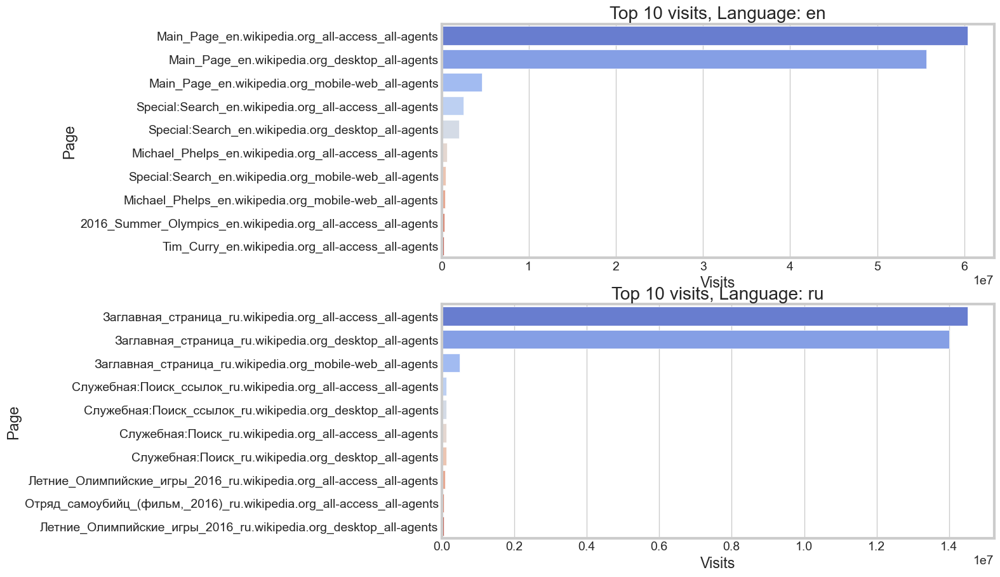

In [42]:
plt.figure(figsize = (10,10))
top = 10 #Let's see top 10 pages
c = 1

for lang in ['en', 'ru']:
    df_lang = df[df['Language'] == lang]
    pv = df_lang.drop(remove_columns, axis=1)
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    pivot = pivot[(pivot['Date'] > '2016-08-10') & (pivot['Date'] < '2016-08-12')]
    
    # Group the page and sum their visits
    visit_lang = pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
    visit_lang_df = pd.DataFrame({'Page':visit_lang.index, 'Visits':list(visit_lang)})
    
    top_visit = visit_lang_df.iloc[:top]
    plt.subplot(2, 1, c)
    title = f'Top {top} visits, Language: {lang}'
    sns.barplot(data=top_visit, y='Page', x='Visits', palette = 'coolwarm').set_title(title);
    c += 1

<h4>We can see another trending page about "Sucide Squad" which is released between 2016, August 1st to 3rd across US States.</h4>

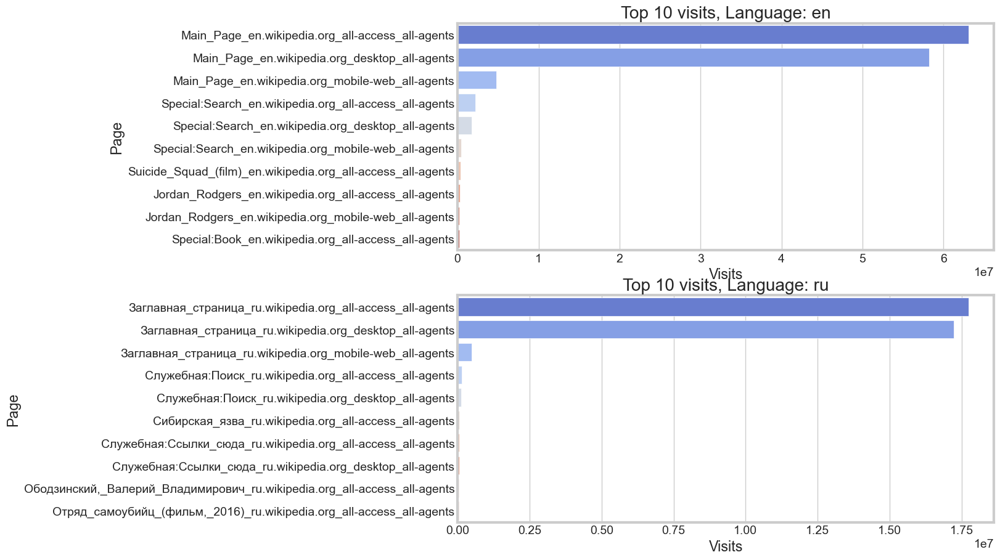

In [43]:
plt.figure(figsize = (10,10))
top = 10 #Let's see top 10 pages
c = 1

for lang in ['en', 'ru']:
    df_lang = df[df['Language'] == lang]
    pv = df_lang.drop(remove_columns, axis=1)
    pivot = pv.melt(id_vars='Page', var_name='Date', value_name='Visits')
    pivot['Date'] = pd.to_datetime(pivot['Date'])
    pivot = pivot[(pivot['Date'] > '2016-08-01') & (pivot['Date'] < '2016-08-03')]
    
    # Group the page and sum their visits
    visit_lang = pivot[['Page', 'Visits']].groupby('Page')['Visits'].sum().sort_values(ascending=False)
    visit_lang_df = pd.DataFrame({'Page':visit_lang.index, 'Visits':list(visit_lang)})
    
    top_visit = visit_lang_df.iloc[:top]
    plt.subplot(2, 1, c)
    title = f'Top {top} visits, Language: {lang}'
    sns.barplot(data=top_visit, y='Page', x='Visits', palette = 'coolwarm').set_title(title);
    c += 1

In [44]:
df_long.head()

,Page,Date,Visits,Year,Month,Day
0,2NE1_zh.wikipedia.org_all-access_spider,2015-07-01,18.0,2015,7,1
1,2PM_zh.wikipedia.org_all-access_spider,2015-07-01,11.0,2015,7,1
2,3C_zh.wikipedia.org_all-access_spider,2015-07-01,1.0,2015,7,1
3,4minute_zh.wikipedia.org_all-access_spider,2015-07-01,35.0,2015,7,1
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,2015-07-01,15.0,2015,7,1


<h3>Let's plot ACF(Auto Correlation Function) and PCAF(Partial Auto Correlation Function) Plots to understand what time period in the past are correlated and help us predict the current/future visits.</h3>

In [45]:
#ACF includes both direct and indirect correlations between time periods.

from statsmodels.graphics.tsaplots import plot_acf

acf = df_long[['Date', 'Visits']]
acf.shape
# .groupby('Date')['Visits'].mean()

(79784650, 2)

In [ ]:
df.head()

In [46]:
removable_columns = ["Name", "Project", "access_agent", "Language"]
selected_df = df.drop(removable_columns, axis = 1)
selected_df.head()

,Page,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,...,12/22/2016,12/23/2016,12/24/2016,12/25/2016,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,15.0,16.0,12.0,20.0,12.0,25.0,25.0,25.0,25.0,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [47]:
selected_row = selected_df.iloc[11636, 1:]
selected_row

7/1/2015      1764.0
7/2/2015      1279.0
7/3/2015      1117.0
7/4/2015      1040.0
7/5/2015      1122.0
               ...  
12/27/2016    1662.0
12/28/2016    1768.0
12/29/2016    1674.0
12/30/2016    1434.0
12/31/2016    1355.0
Name: 11636, Length: 550, dtype: object

In [48]:
selected_row = selected_row.astype(float)
selected_row

7/1/2015      1764.0
7/2/2015      1279.0
7/3/2015      1117.0
7/4/2015      1040.0
7/5/2015      1122.0
               ...  
12/27/2016    1662.0
12/28/2016    1768.0
12/29/2016    1674.0
12/30/2016    1434.0
12/31/2016    1355.0
Name: 11636, Length: 550, dtype: float64

<Figure size 1000x500 with 0 Axes>

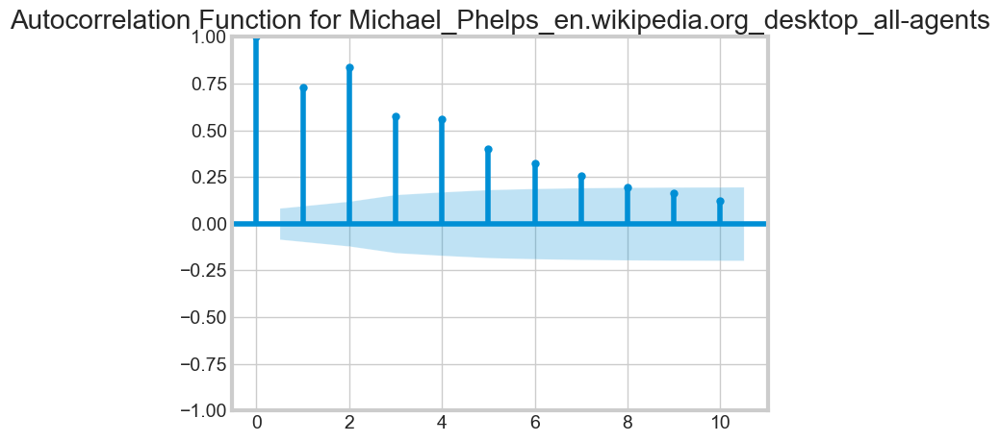

In [49]:
plt.figure(figsize=(10, 5))
plot_acf(selected_row, lags = 10)
plt.title(f'Autocorrelation Function for {df.iloc[11636, 0]}')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(18, 7))
plot_acf(acf, lags = 30) #Let's set lags = 365(year to year autocorrelation)
plt.show()

We can see there is a decline over lags.

In [ ]:
# plot_acf(acf, lags = 90) #Quarter to Quarter Auto correlation

If we can see the auto correlation plot for the page **"Michael_Phelps_en.wikipedia.org_desktop_all_agents"** after 8 lags the contribution of previous time steps data are not contributing or giving confidence to the current time steps. So I want to select look_back/Time Steps as 8 and based on this I want to create my dataset of this page into train, validation and test sets.

<br></br>
<h2>Model Building</h2>
<h3>Let's build a feed forward neural network and see how it is prediciting the data.</h3>

In [73]:
from sklearn.preprocessing import MinMaxScaler

In [51]:
train = pd.read_csv('./Datasets/train_1.csv', parse_dates = True)

In [52]:
train.head()

,Page,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,...,12/22/2016,12/23/2016,12/24/2016,12/25/2016,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,15.0,16.0,12.0,20.0,12.0,25.0,25.0,25.0,25.0,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [53]:
m_data = train.drop('Page', axis = 1)

In [54]:
m_data.isnull().sum()

7/1/2015      20739
7/2/2015      20815
7/3/2015      20543
7/4/2015      20653
7/5/2015      20658
              ...  
12/27/2016     3701
12/28/2016     3822
12/29/2016     3826
12/30/2016     3635
12/31/2016     3465
Length: 550, dtype: int64

In [55]:
m_data.head()

,7/1/2015,7/2/2015,7/3/2015,7/4/2015,7/5/2015,7/6/2015,7/7/2015,7/8/2015,7/9/2015,7/10/2015,...,12/22/2016,12/23/2016,12/24/2016,12/25/2016,12/26/2016,12/27/2016,12/28/2016,12/29/2016,12/30/2016,12/31/2016
0,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,15.0,16.0,12.0,20.0,12.0,25.0,25.0,25.0,25.0,25.0,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [56]:
m_data.fillna(0, inplace = True)

In [57]:
m_data.isnull().sum()

7/1/2015      0
7/2/2015      0
7/3/2015      0
7/4/2015      0
7/5/2015      0
             ..
12/27/2016    0
12/28/2016    0
12/29/2016    0
12/30/2016    0
12/31/2016    0
Length: 550, dtype: int64

In [58]:
row = m_data.iloc[11636, :]
row

7/1/2015      1764.0
7/2/2015      1279.0
7/3/2015      1117.0
7/4/2015      1040.0
7/5/2015      1122.0
               ...  
12/27/2016    1662.0
12/28/2016    1768.0
12/29/2016    1674.0
12/30/2016    1434.0
12/31/2016    1355.0
Name: 11636, Length: 550, dtype: float64

In [59]:
Scaler = MinMaxScaler()
scaled_data = Scaler.fit_transform(np.array(row).reshape(-1, 1))

In [564]:
print(scaled_data)

[[2.32012949e-03]
 [1.25352968e-03]
 [8.97263347e-04]
 [7.27926882e-04]
 [9.08259221e-04]
 [1.85830276e-03]
 [1.97485903e-03]
 [2.23436167e-03]
 [2.49386430e-03]
 [1.55701581e-03]
 [1.77033577e-03]
 [1.82971349e-03]
 [2.25635342e-03]
 [2.01004583e-03]
 [2.44108411e-03]
 [2.58842882e-03]
 [1.90008709e-03]
 [1.30411070e-03]
 [1.63178775e-03]
 [2.22336579e-03]
 [3.35374168e-03]
 [1.84730689e-03]
 [2.00784666e-03]
 [2.11120787e-03]
 [2.40589731e-03]
 [2.45867750e-03]
 [2.42788906e-03]
 [2.23656084e-03]
 [1.96386316e-03]
 [2.30253609e-03]
 [2.79075291e-03]
 [1.54162158e-03]
 [3.12942584e-03]
 [5.25822711e-03]
 [7.41121931e-03]
 [9.16836003e-03]
 [1.40461299e-02]
 [8.82968710e-03]
 [1.41362961e-02]
 [1.56141416e-02]
 [1.30103185e-02]
 [6.98677856e-03]
 [5.17465847e-03]
 [3.82876345e-03]
 [4.84478224e-03]
 [2.96008937e-03]
 [4.28619182e-03]
 [3.81996675e-03]
 [2.40589731e-03]
 [2.75556611e-03]
 [1.85830276e-03]
 [1.48224386e-03]
 [1.80992092e-03]
 [2.67639582e-03]
 [5.24723124e-03]
 [2.817143

In [77]:
def create_dataset(dataset, look_back):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
#         print(a)
        dataY.append(dataset[i+look_back, 0])
    return np.array(dataX), np.array(dataY)

In [61]:
X, y = create_dataset(scaled_data.reshape(-1, 1), look_back = 8)

In [62]:
X.shape

(542, 8)

In [63]:
from math import ceil

train_size = int(ceil(len(X) * 0.70))
val_size = int(ceil(len(X) * 0.85))

x_train = X[0:train_size]
x_val = X[train_size:val_size]
x_test = X[val_size:]

In [64]:
target_train = int(ceil(len(y) * 0.70))
target_val = int(ceil(len(y) * 0.85))

y_train = y[0:target_train]
y_val = y[target_train:target_val]
y_test = y[target_val:]

In [374]:
x_test.shape

(81, 8, 1)

In [66]:
# Reshape the data for the lstm model
x_train = np.reshape(x_train, (x_train.shape[0], 8, 1))
x_val = np.reshape(x_val, (x_val.shape[0], 8, 1))
x_test = np.reshape(x_test, (x_test.shape[0], 8, 1))

In [67]:
y_train.shape

(380,)

In [68]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

model_LSTM = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences=False),
    Dense(1)
])

In [69]:
model_LSTM.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 20)                1760      
                                                                 
 dense (Dense)               (None, 1)                 21        
                                                                 
Total params: 1,781
Trainable params: 1,781
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# import tensorflow as tf

# tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [70]:
model_LSTM.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [85]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='loss', patience=5, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('./weights/model_LSTM.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [72]:
model_LSTM.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size = 4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
91/95 [===========================>..] - ETA: 0s - loss: 9.9976e-05 - mean_absolute_error: 0.0045
Epoch 1: val_mean_absolute_error improved from inf to 0.06264, saving model to ./weights\model_LSTM.h5
95/95 [==============================] - 6s 20ms/step - loss: 9.5956e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0302 - val_mean_absolute_error: 0.0626
Epoch 2/20
94/95 [============================>.] - ETA: 0s - loss: 8.8810e-05 - mean_absolute_error: 0.0032
Epoch 2: val_mean_absolute_error improved from 0.06264 to 0.05312, saving model to ./weights\model_LSTM.h5
95/95 [==============================] - 1s 8ms/step - loss: 8.7901e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0261 - val_mean_absolute_error: 0.0531
Epoch 3/20
90/95 [===========================>..] - ETA: 0s - loss: 8.0670e-05 - mean_absolute_error: 0.0032
Epoch 3: val_mean_absolute_error improved from 0.05312 to 0.04704, saving model to ./weights\model_LSTM.h5
95/95 [==============================] - 1s 9

In [ ]:
# loss = LSTM_history.history['loss']
# mae = LSTM_history.history['mean_absolute_error']
# val_loss = LSTM_history.history['val_loss']
# val_mae = LSTM_history.history['val_mean_absolute_error']

# epochs_range = range(len(loss))

# plt.figure(figsize = (20,10))

# plt.subplot(1,2,1)
# plt.plot(epochs_range, loss, label = 'Training Loss')
# plt.plot(epochs_range, val_loss, label = 'Validation Loss')
# plt.legend(loc = 'upper right')
# plt.title('Training and Validation Losses')

# plt.subplot(1, 2, 2)
# plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
# plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
# plt.legend(loc = 'upper right')
# plt.title('Training and Validation Mean Absolute Errors')

In [73]:
y_pred = model_LSTM.predict(x_test)

3/3 [==============================] - 1s 5ms/step


In [74]:
#Let's inverse them back to original

# train_pred_inverse = Scaler.inverse_transform(train_predictions)
# train_true_inverse = Scaler.inverse_transform([y_train])
test_pred_inverse = Scaler.inverse_transform(y_pred)
test_true_inverse = Scaler.inverse_transform([y_test])

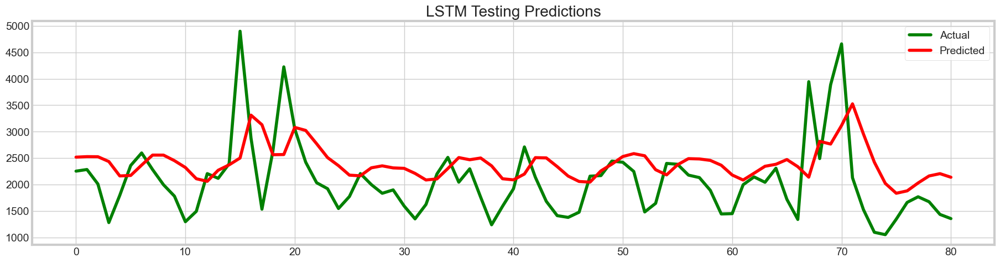

In [75]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [128]:
def smape(y_true, y_pred):
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2.0
    diff = np.abs(y_true - y_pred) / np.where(denominator == 0, 1, denominator)  # Avoid division by zero
    return np.nanmean(diff) * 100

In [77]:
test_error = smape(test_true_inverse.reshape(-1,1), test_pred_inverse.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error}')

SMAPE
Test Error: 26.598472111759648


**The model's predictions deviate from the actual values by approximately 21.95% on average.**

<h5>Let's try another architecture:</h5>

In [78]:
model_LSTM1 = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences=True),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [79]:
model_LSTM1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 8, 20)             1760      
                                                                 
 lstm_2 (LSTM)               (None, 8)                 928       
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2,697
Trainable params: 2,697
Non-trainable params: 0
_________________________________________________________________


In [80]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM1.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [81]:
model_LSTM1.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [82]:
history_LSTM1 = model_LSTM1.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size = 4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
91/95 [===========================>..] - ETA: 0s - loss: 1.0489e-04 - mean_absolute_error: 0.0048
Epoch 1: val_mean_absolute_error improved from inf to 0.05821, saving model to ./weights\model_LSTM1.h5
95/95 [==============================] - 9s 31ms/step - loss: 1.0249e-04 - mean_absolute_error: 0.0049 - val_loss: 0.0282 - val_mean_absolute_error: 0.0582
Epoch 2/20
94/95 [============================>.] - ETA: 0s - loss: 8.8977e-05 - mean_absolute_error: 0.0038
Epoch 2: val_mean_absolute_error improved from 0.05821 to 0.05456, saving model to ./weights\model_LSTM1.h5
95/95 [==============================] - 1s 13ms/step - loss: 8.8086e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0261 - val_mean_absolute_error: 0.0546
Epoch 3/20
91/95 [===========================>..] - ETA: 0s - loss: 8.4716e-05 - mean_absolute_error: 0.0035
Epoch 3: val_mean_absolute_error improved from 0.05456 to 0.05181, saving model to ./weights\model_LSTM1.h5
95/95 [==============================] - 

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

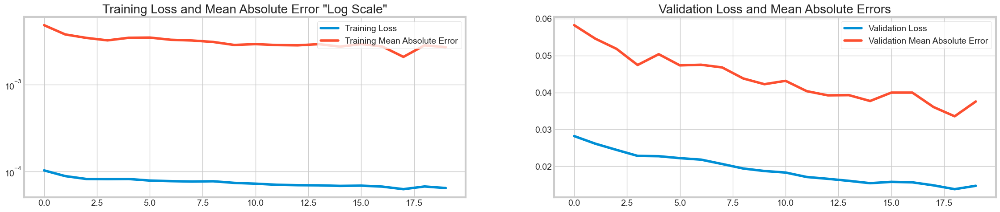

In [83]:
loss = history_LSTM1.history['loss']
mae = history_LSTM1.history['mean_absolute_error']
val_loss = history_LSTM1.history['val_loss']
val_mae = history_LSTM1.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [84]:
y_pred1 = model_LSTM1.predict(x_test)

3/3 [==============================] - 1s 4ms/step


In [85]:
test_pred_inverse1 = Scaler.inverse_transform(y_pred1)
test_true_inverse1 = Scaler.inverse_transform([y_test])

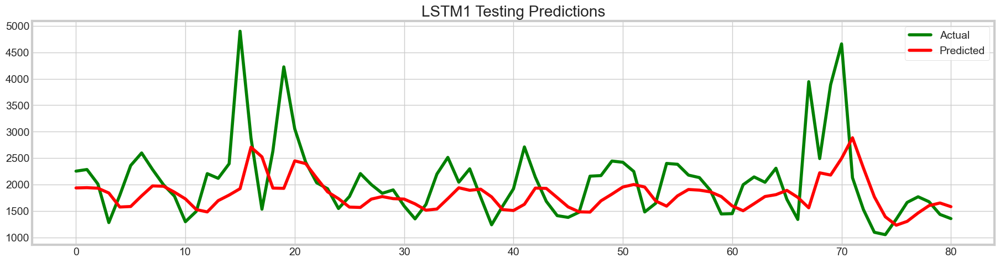

In [86]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse1.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse1.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM1 Testing Predictions")
plt.legend()
plt.show()

In [87]:
test_error1 = smape(test_true_inverse1.reshape(-1,1), test_pred_inverse1.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error1}')

SMAPE
Test Error: 22.625692658043796


In [88]:
model_LSTM2 = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences=True),
    LSTM(8, return_sequences = False),
    Dense(10),
    Dense(1)
])

In [89]:
model_LSTM2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 8, 20)             1760      
                                                                 
 lstm_4 (LSTM)               (None, 8)                 928       
                                                                 
 dense_2 (Dense)             (None, 10)                90        
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 2,789
Trainable params: 2,789
Non-trainable params: 0
_________________________________________________________________


In [90]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM2.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [91]:
model_LSTM2.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [92]:
history_LSTM2 = model_LSTM2.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 1.0136e-04 - mean_absolute_error: 0.0047
Epoch 1: val_mean_absolute_error improved from inf to 0.05392, saving model to ./weights\model_LSTM2.h5
95/95 [==============================] - 9s 31ms/step - loss: 1.0035e-04 - mean_absolute_error: 0.0047 - val_loss: 0.0259 - val_mean_absolute_error: 0.0539
Epoch 2/20
93/95 [============================>.] - ETA: 0s - loss: 9.6411e-05 - mean_absolute_error: 0.0043
Epoch 2: val_mean_absolute_error did not improve from 0.05392
95/95 [==============================] - 1s 13ms/step - loss: 9.4803e-05 - mean_absolute_error: 0.0043 - val_loss: 0.0263 - val_mean_absolute_error: 0.0569
Epoch 3/20
95/95 [==============================] - ETA: 0s - loss: 7.9554e-05 - mean_absolute_error: 0.0031
Epoch 3: val_mean_absolute_error improved from 0.05392 to 0.05153, saving model to ./weights\model_LSTM2.h5
95/95 [==============================] - 1s 13ms/step - loss: 7.9554e-05 - mean_absolut

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

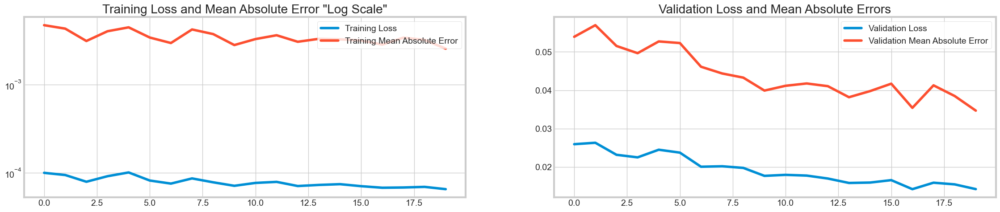

In [93]:
loss = history_LSTM2.history['loss']
mae = history_LSTM2.history['mean_absolute_error']
val_loss = history_LSTM2.history['val_loss']
val_mae = history_LSTM2.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [94]:
y_pred2 = model_LSTM2.predict(x_test)

3/3 [==============================] - 2s 13ms/step


In [95]:
test_pred_inverse2 = Scaler.inverse_transform(y_pred2)
test_true_inverse2 = Scaler.inverse_transform([y_test])

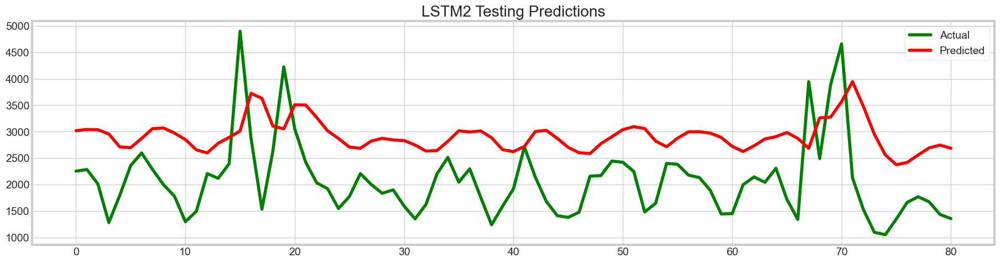

In [96]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse2.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse2.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM2 Testing Predictions")
plt.legend()
plt.show()

In [97]:
test_error2 = smape(test_true_inverse2.reshape(-1,1), test_pred_inverse2.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error2}')

SMAPE
Test Error: 41.55166377174982


In [98]:
model_LSTM3 = Sequential([
    LSTM(25, input_shape=(8,1), return_sequences = True),
    LSTM(10, return_sequences = True),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [99]:
model_LSTM3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_5 (LSTM)               (None, 8, 25)             2700      
                                                                 
 lstm_6 (LSTM)               (None, 8, 10)             1440      
                                                                 
 lstm_7 (LSTM)               (None, 8)                 608       
                                                                 
 dense_4 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,757
Trainable params: 4,757
Non-trainable params: 0
_________________________________________________________________


In [100]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM3.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [101]:
model_LSTM3.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [102]:
history_LSTM3 = model_LSTM3.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 8.9850e-05 - mean_absolute_error: 0.0041
Epoch 1: val_mean_absolute_error improved from inf to 0.06125, saving model to ./weights\model_LSTM3.h5
95/95 [==============================] - 13s 43ms/step - loss: 8.9019e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0290 - val_mean_absolute_error: 0.0612
Epoch 2/20
95/95 [==============================] - ETA: 0s - loss: 8.5419e-05 - mean_absolute_error: 0.0034
Epoch 2: val_mean_absolute_error did not improve from 0.06125
95/95 [==============================] - 2s 17ms/step - loss: 8.5419e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0284 - val_mean_absolute_error: 0.0615
Epoch 3/20
94/95 [============================>.] - ETA: 0s - loss: 8.6062e-05 - mean_absolute_error: 0.0035
Epoch 3: val_mean_absolute_error improved from 0.06125 to 0.05952, saving model to ./weights\model_LSTM3.h5
95/95 [==============================] - 2s 18ms/step - loss: 8.5382e-05 - mean_absolu

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

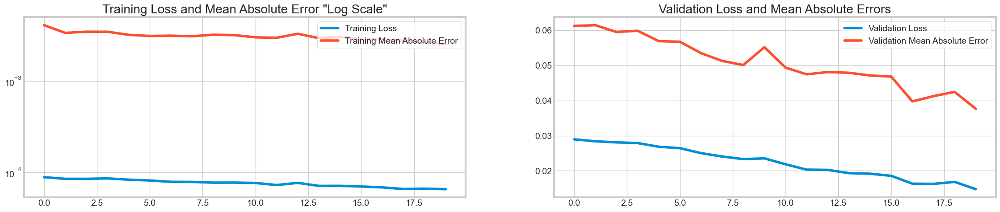

In [103]:
loss = history_LSTM3.history['loss']
mae = history_LSTM3.history['mean_absolute_error']
val_loss = history_LSTM3.history['val_loss']
val_mae = history_LSTM3.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [104]:
y_pred3 = model_LSTM3.predict(x_test)

3/3 [==============================] - 2s 8ms/step


In [105]:
test_pred_inverse3 = Scaler.inverse_transform(y_pred3)
test_true_inverse3 = Scaler.inverse_transform([y_test])

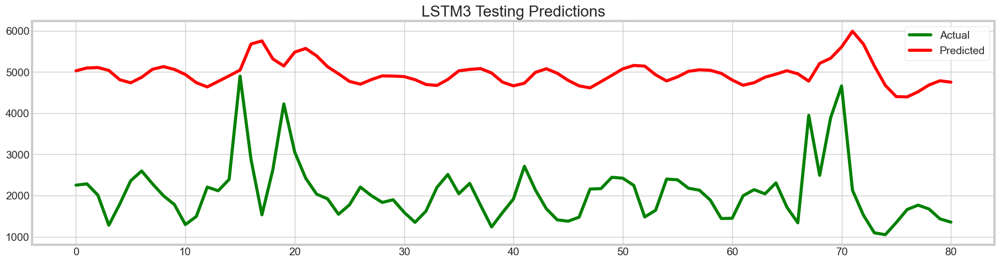

In [106]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse3.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse3.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM3 Testing Predictions")
plt.legend()
plt.show()

In [107]:
test_error3 = smape(test_true_inverse3.reshape(-1,1), test_pred_inverse3.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error3}')

SMAPE
Test Error: 84.78224687042156


In [108]:
model_LSTM4 = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences = True),
    LSTM(8, return_sequences = True),
    LSTM(2, return_sequences = False),
    Dense(1)
])

In [109]:
model_LSTM4.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 8, 20)             1760      
                                                                 
 lstm_9 (LSTM)               (None, 8, 8)              928       
                                                                 
 lstm_10 (LSTM)              (None, 2)                 88        
                                                                 
 dense_5 (Dense)             (None, 1)                 3         
                                                                 
Total params: 2,779
Trainable params: 2,779
Non-trainable params: 0
_________________________________________________________________


In [110]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM4.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [111]:
model_LSTM4.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [112]:
history_LSTM4 = model_LSTM4.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
95/95 [==============================] - ETA: 0s - loss: 8.5427e-05 - mean_absolute_error: 0.0036
Epoch 1: val_mean_absolute_error improved from inf to 0.06293, saving model to ./weights\model_LSTM4.h5
95/95 [==============================] - 13s 43ms/step - loss: 8.5427e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0296 - val_mean_absolute_error: 0.0629
Epoch 2/20
95/95 [==============================] - ETA: 0s - loss: 8.3820e-05 - mean_absolute_error: 0.0032
Epoch 2: val_mean_absolute_error improved from 0.06293 to 0.06232, saving model to ./weights\model_LSTM4.h5
95/95 [==============================] - 2s 18ms/step - loss: 8.3820e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0292 - val_mean_absolute_error: 0.0623
Epoch 3/20
95/95 [==============================] - ETA: 0s - loss: 8.5056e-05 - mean_absolute_error: 0.0034
Epoch 3: val_mean_absolute_error improved from 0.06232 to 0.06051, saving model to ./weights\model_LSTM4.h5
95/95 [==============================] -

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

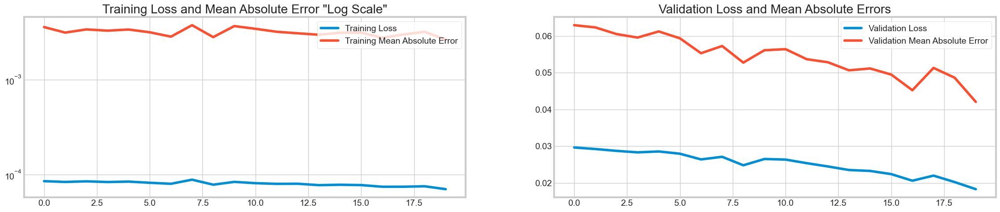

In [113]:
loss = history_LSTM4.history['loss']
mae = history_LSTM4.history['mean_absolute_error']
val_loss = history_LSTM4.history['val_loss']
val_mae = history_LSTM4.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [114]:
y_pred4 = model_LSTM4.predict(x_test)

3/3 [==============================] - 2s 7ms/step


In [115]:
test_pred_inverse4 = Scaler.inverse_transform(y_pred4)
test_true_inverse4 = Scaler.inverse_transform([y_test])

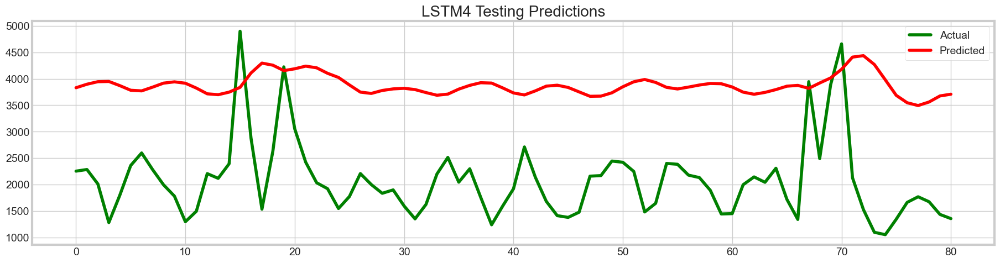

In [116]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse4.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse4.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM4 Testing Predictions")
plt.legend()
plt.show()

In [117]:
test_error4 = smape(test_true_inverse4.reshape(-1,1), test_pred_inverse4.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error4}')

SMAPE
Test Error: 64.7529769336838


In [118]:
model_LSTM5 = Sequential([
    LSTM(10, input_shape=(8,1), return_sequences = True),
    LSTM(8, return_sequences = True),
    LSTM(6, return_sequences = False),
    Dense(1)
])

In [119]:
model_LSTM5.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 8, 10)             480       
                                                                 
 lstm_12 (LSTM)              (None, 8, 8)              608       
                                                                 
 lstm_13 (LSTM)              (None, 6)                 360       
                                                                 
 dense_6 (Dense)             (None, 1)                 7         
                                                                 
Total params: 1,455
Trainable params: 1,455
Non-trainable params: 0
_________________________________________________________________


In [120]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM5.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [121]:
model_LSTM5.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [122]:
history_LSTM5 = model_LSTM5.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
92/95 [============================>.] - ETA: 0s - loss: 8.4301e-05 - mean_absolute_error: 0.0033
Epoch 1: val_mean_absolute_error improved from inf to 0.05802, saving model to ./weights\model_LSTM5.h5
95/95 [==============================] - 13s 43ms/step - loss: 8.6508e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0268 - val_mean_absolute_error: 0.0580
Epoch 2/20
94/95 [============================>.] - ETA: 0s - loss: 9.1520e-05 - mean_absolute_error: 0.0034
Epoch 2: val_mean_absolute_error improved from 0.05802 to 0.05729, saving model to ./weights\model_LSTM5.h5
95/95 [==============================] - 2s 16ms/step - loss: 9.0612e-05 - mean_absolute_error: 0.0034 - val_loss: 0.0278 - val_mean_absolute_error: 0.0573
Epoch 3/20
93/95 [============================>.] - ETA: 0s - loss: 8.3086e-05 - mean_absolute_error: 0.0033
Epoch 3: val_mean_absolute_error did not improve from 0.05729
95/95 [==============================] - 1s 16ms/step - loss: 8.4663e-05 - mean_absolu

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

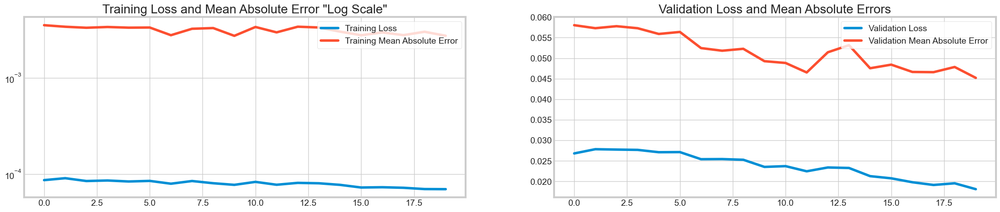

In [123]:
loss = history_LSTM5.history['loss']
mae = history_LSTM5.history['mean_absolute_error']
val_loss = history_LSTM5.history['val_loss']
val_mae = history_LSTM5.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [124]:
y_pred5 = model_LSTM5.predict(x_test)

3/3 [==============================] - 2s 8ms/step


In [125]:
test_pred_inverse5 = Scaler.inverse_transform(y_pred5)
test_true_inverse5 = Scaler.inverse_transform([y_test])

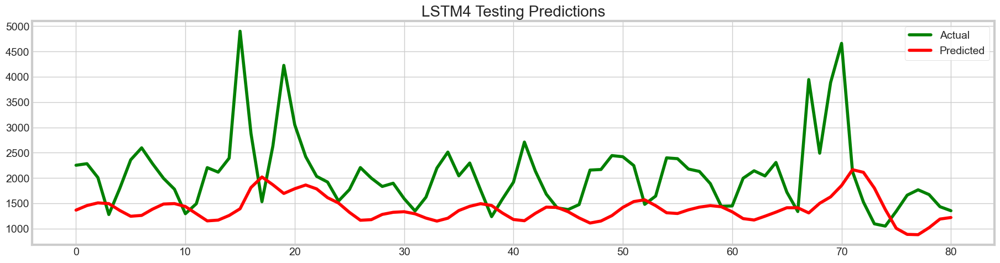

In [126]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse5.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse5.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM4 Testing Predictions")
plt.legend()
plt.show()

In [127]:
test_error5 = smape(test_true_inverse5.reshape(-1,1), test_pred_inverse5.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error5}')

SMAPE
Test Error: 39.46390271807237


In [128]:
model_LSTM6 = Sequential([
    LSTM(8, input_shape=(8,1), return_sequences = True),
    LSTM(4, return_sequences = True),
    LSTM(2, return_sequences = False),
    Dense(1)
])

In [129]:
model_LSTM6.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (None, 8, 8)              320       
                                                                 
 lstm_15 (LSTM)              (None, 8, 4)              208       
                                                                 
 lstm_16 (LSTM)              (None, 2)                 56        
                                                                 
 dense_7 (Dense)             (None, 1)                 3         
                                                                 
Total params: 587
Trainable params: 587
Non-trainable params: 0
_________________________________________________________________


In [130]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM6.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [131]:
model_LSTM6.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [132]:
history_LSTM6 = model_LSTM6.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 1.0285e-04 - mean_absolute_error: 0.0050
Epoch 1: val_mean_absolute_error improved from inf to 0.07300, saving model to ./weights\model_LSTM6.h5
95/95 [==============================] - 12s 41ms/step - loss: 1.0177e-04 - mean_absolute_error: 0.0049 - val_loss: 0.0340 - val_mean_absolute_error: 0.0730
Epoch 2/20
93/95 [============================>.] - ETA: 0s - loss: 9.2872e-05 - mean_absolute_error: 0.0036
Epoch 2: val_mean_absolute_error improved from 0.07300 to 0.06737, saving model to ./weights\model_LSTM6.h5
95/95 [==============================] - 2s 18ms/step - loss: 9.1229e-05 - mean_absolute_error: 0.0036 - val_loss: 0.0315 - val_mean_absolute_error: 0.0674
Epoch 3/20
94/95 [============================>.] - ETA: 0s - loss: 9.1806e-05 - mean_absolute_error: 0.0042
Epoch 3: val_mean_absolute_error improved from 0.06737 to 0.06665, saving model to ./weights\model_LSTM6.h5
95/95 [==============================] -

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

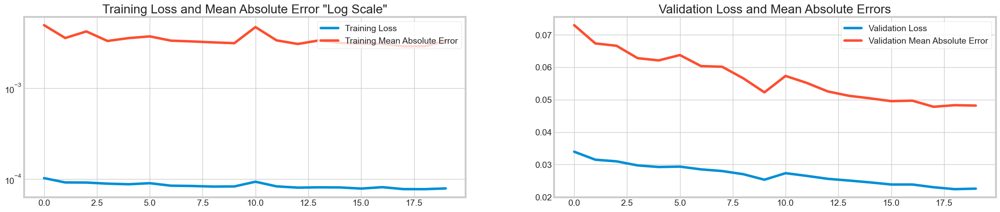

In [133]:
loss = history_LSTM6.history['loss']
mae = history_LSTM6.history['mean_absolute_error']
val_loss = history_LSTM6.history['val_loss']
val_mae = history_LSTM6.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [134]:
y_pred6 = model_LSTM6.predict(x_test)

3/3 [==============================] - 3s 4ms/step


In [135]:
test_pred_inverse6 = Scaler.inverse_transform(y_pred6)
test_true_inverse6 = Scaler.inverse_transform([y_test])

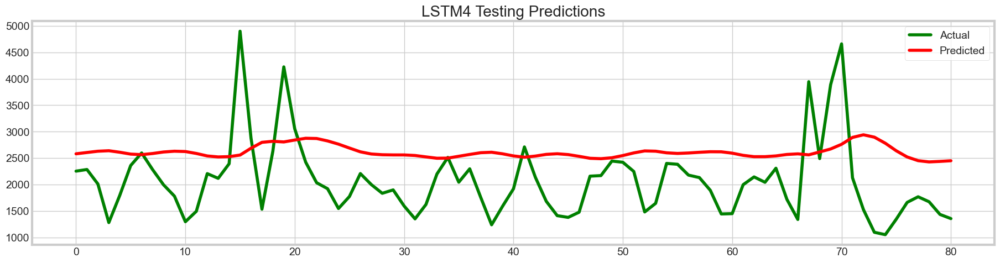

In [136]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse6.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse6.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM4 Testing Predictions")
plt.legend()
plt.show()

In [137]:
test_error6 = smape(test_true_inverse6.reshape(-1,1), test_pred_inverse6.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error6}')

SMAPE
Test Error: 33.63247212553018


In [138]:
model_LSTM7 = Sequential([
    LSTM(10, input_shape=(8,1), return_sequences = True),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [139]:
model_LSTM7.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_17 (LSTM)              (None, 8, 10)             480       
                                                                 
 lstm_18 (LSTM)              (None, 8)                 608       
                                                                 
 dense_8 (Dense)             (None, 1)                 9         
                                                                 
Total params: 1,097
Trainable params: 1,097
Non-trainable params: 0
_________________________________________________________________


In [140]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM7.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [141]:
model_LSTM7.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [142]:
history_LSTM7 = model_LSTM7.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 9.2418e-05 - mean_absolute_error: 0.0038
Epoch 1: val_mean_absolute_error improved from inf to 0.06025, saving model to ./weights\model_LSTM7.h5
95/95 [==============================] - 9s 32ms/step - loss: 9.1467e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0289 - val_mean_absolute_error: 0.0603
Epoch 2/20
95/95 [==============================] - ETA: 0s - loss: 8.1063e-05 - mean_absolute_error: 0.0031
Epoch 2: val_mean_absolute_error improved from 0.06025 to 0.05583, saving model to ./weights\model_LSTM7.h5
95/95 [==============================] - 1s 13ms/step - loss: 8.1063e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0272 - val_mean_absolute_error: 0.0558
Epoch 3/20
92/95 [============================>.] - ETA: 0s - loss: 8.2478e-05 - mean_absolute_error: 0.0032
Epoch 3: val_mean_absolute_error improved from 0.05583 to 0.05497, saving model to ./weights\model_LSTM7.h5
95/95 [==============================] - 

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

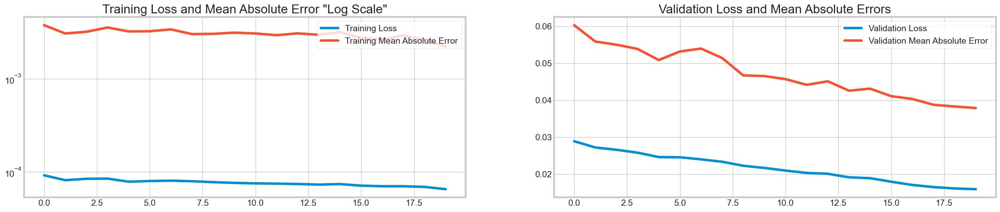

In [143]:
loss = history_LSTM7.history['loss']
mae = history_LSTM7.history['mean_absolute_error']
val_loss = history_LSTM7.history['val_loss']
val_mae = history_LSTM7.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [144]:
y_pred7 = model_LSTM7.predict(x_test)

3/3 [==============================] - 1s 5ms/step


In [145]:
test_pred_inverse7 = Scaler.inverse_transform(y_pred7)
test_true_inverse7 = Scaler.inverse_transform([y_test])

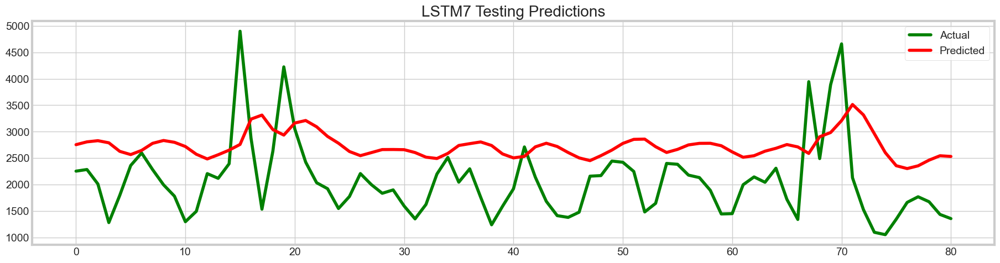

In [147]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse7.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse7.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM7 Testing Predictions")
plt.legend()
plt.show()

In [149]:
test_error7 = smape(test_true_inverse7.reshape(-1,1), test_pred_inverse7.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error7}')

SMAPE
Test Error: 36.32204383534875


In [150]:
model_LSTM8 = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences = True),
    LSTM(10, return_sequences = False),
    Dense(1)
])

In [151]:
model_LSTM8.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_19 (LSTM)              (None, 8, 20)             1760      
                                                                 
 lstm_20 (LSTM)              (None, 10)                1240      
                                                                 
 dense_9 (Dense)             (None, 1)                 11        
                                                                 
Total params: 3,011
Trainable params: 3,011
Non-trainable params: 0
_________________________________________________________________


In [152]:
model_checkpoint = ModelCheckpoint('./weights/model_LSTM8.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [153]:
model_LSTM8.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [154]:
history_LSTM8 = model_LSTM8.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=30, batch_size=4, callbacks=[early_stopping, model_checkpoint])

Epoch 1/30
94/95 [============================>.] - ETA: 0s - loss: 8.8861e-05 - mean_absolute_error: 0.0041
Epoch 1: val_mean_absolute_error improved from inf to 0.05683, saving model to ./weights\model_LSTM8.h5
95/95 [==============================] - 9s 33ms/step - loss: 8.8065e-05 - mean_absolute_error: 0.0041 - val_loss: 0.0271 - val_mean_absolute_error: 0.0568
Epoch 2/30
91/95 [===========================>..] - ETA: 0s - loss: 9.2575e-05 - mean_absolute_error: 0.0039
Epoch 2: val_mean_absolute_error improved from 0.05683 to 0.05283, saving model to ./weights\model_LSTM8.h5
95/95 [==============================] - 1s 14ms/step - loss: 8.9465e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0254 - val_mean_absolute_error: 0.0528
Epoch 3/30
92/95 [============================>.] - ETA: 0s - loss: 8.5651e-05 - mean_absolute_error: 0.0037
Epoch 3: val_mean_absolute_error improved from 0.05283 to 0.05216, saving model to ./weights\model_LSTM8.h5
95/95 [==============================] - 

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

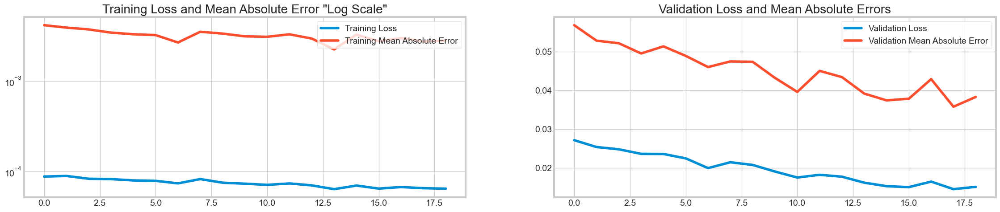

In [155]:
loss = history_LSTM8.history['loss']
mae = history_LSTM8.history['mean_absolute_error']
val_loss = history_LSTM8.history['val_loss']
val_mae = history_LSTM8.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [156]:
y_pred8 = model_LSTM8.predict(x_test)

3/3 [==============================] - 1s 10ms/step


In [157]:
test_pred_inverse8 = Scaler.inverse_transform(y_pred8)
test_true_inverse8 = Scaler.inverse_transform([y_test])

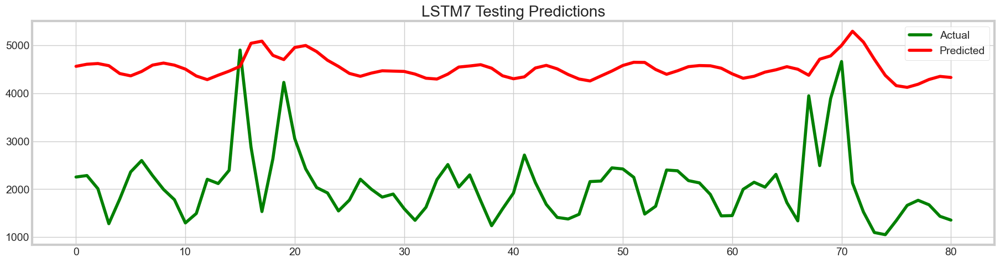

In [158]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse8.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse8.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM7 Testing Predictions")
plt.legend()
plt.show()

In [172]:
test_error8 = smape(test_true_inverse8.reshape(-1,1), test_pred_inverse8.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error8}')

SMAPE
Test Error: 77.29040420943647


In [173]:
model_LSTM9 = Sequential([
    LSTM(8, input_shape = (8, 1), return_sequences=True),
    LSTM(4, return_sequences=True),
    LSTM(2, return_sequences=False),
    Dense(1)
])

In [174]:
model_LSTM9.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_24 (LSTM)              (None, 8, 8)              320       
                                                                 
 lstm_25 (LSTM)              (None, 8, 4)              208       
                                                                 
 lstm_26 (LSTM)              (None, 2)                 56        
                                                                 
 dense_11 (Dense)            (None, 1)                 3         
                                                                 
Total params: 587
Trainable params: 587
Non-trainable params: 0
_________________________________________________________________


In [178]:
model_checkpoint9 = ModelCheckpoint('./weights/model_LSTM9ii.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [179]:
model_LSTM9.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [180]:
history_LSTM9 = model_LSTM9.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint9])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 7.0519e-05 - mean_absolute_error: 0.0030
Epoch 1: val_mean_absolute_error improved from inf to 0.04811, saving model to ./weights\model_LSTM9ii.h5
95/95 [==============================] - 14s 41ms/step - loss: 6.9881e-05 - mean_absolute_error: 0.0030 - val_loss: 0.0186 - val_mean_absolute_error: 0.0481
Epoch 2/20
92/95 [============================>.] - ETA: 0s - loss: 7.3763e-05 - mean_absolute_error: 0.0031
Epoch 2: val_mean_absolute_error did not improve from 0.04811
95/95 [==============================] - 2s 16ms/step - loss: 7.1561e-05 - mean_absolute_error: 0.0031 - val_loss: 0.0186 - val_mean_absolute_error: 0.0484
Epoch 3/20
95/95 [==============================] - ETA: 0s - loss: 6.9065e-05 - mean_absolute_error: 0.0030
Epoch 3: val_mean_absolute_error improved from 0.04811 to 0.04619, saving model to ./weights\model_LSTM9ii.h5
95/95 [==============================] - 2s 17ms/step - loss: 6.9065e-05 - mean_ab

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

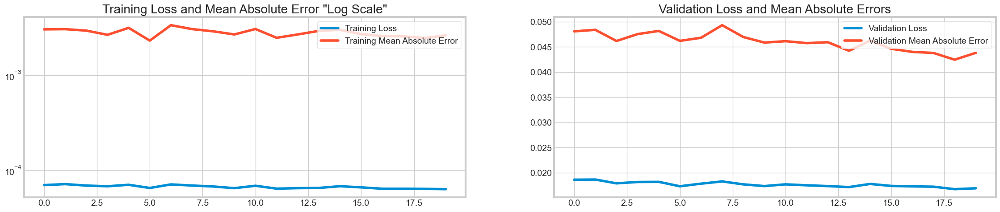

In [181]:
loss = history_LSTM9.history['loss']
mae = history_LSTM9.history['mean_absolute_error']
val_loss = history_LSTM9.history['val_loss']
val_mae = history_LSTM9.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [182]:
y_pred9 = model_LSTM9.predict(x_test)

3/3 [==============================] - 2s 4ms/step


In [183]:
test_pred_inverse9 = Scaler.inverse_transform(y_pred9)
test_true_inverse9 = Scaler.inverse_transform([y_test])

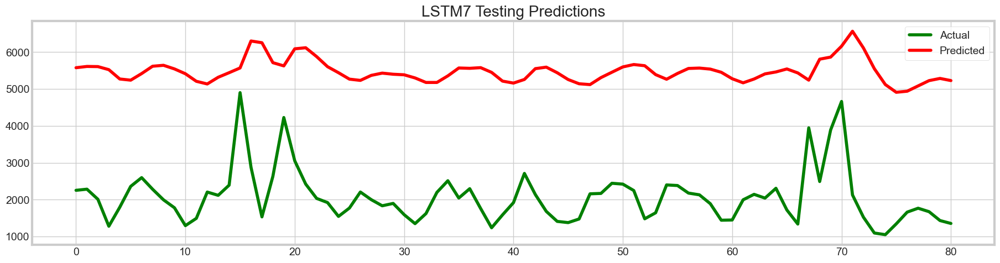

In [184]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverse9.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverse9.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM7 Testing Predictions")
plt.legend()
plt.show()

In [186]:
test_error9 = smape(test_true_inverse9.reshape(-1,1), test_pred_inverse9.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error9}')

SMAPE
Test Error: 92.49535353902266


<br></br>
<h3>Second model (model_LSTM1) is doing better compared to other other type of model architectures</h3>
<h4>Let's use some regularization techniques to test the model and see how the error gonna change:</h4>

In [187]:
from tensorflow.keras.layers import Dropout

In [202]:
model_fit = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences=True),
    Dropout(0.2),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [203]:
model_fit.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_32 (LSTM)              (None, 8, 20)             1760      
                                                                 
 dropout_3 (Dropout)         (None, 8, 20)             0         
                                                                 
 lstm_33 (LSTM)              (None, 8)                 928       
                                                                 
 dense_14 (Dense)            (None, 1)                 9         
                                                                 
Total params: 2,697
Trainable params: 2,697
Non-trainable params: 0
_________________________________________________________________


In [207]:
model_checkpoint_fit = ModelCheckpoint('./weights/model_LSTMFit+.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [208]:
model_fit.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [209]:
history_fit = model_fit.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=30, batch_size=4, callbacks=[early_stopping, model_checkpoint_fit])

Epoch 1/30
95/95 [==============================] - ETA: 0s - loss: 6.7378e-05 - mean_absolute_error: 0.0029
Epoch 1: val_mean_absolute_error improved from inf to 0.03685, saving model to ./weights\model_LSTMFit+.h5
95/95 [==============================] - 5s 19ms/step - loss: 6.7378e-05 - mean_absolute_error: 0.0029 - val_loss: 0.0148 - val_mean_absolute_error: 0.0369
Epoch 2/30
93/95 [============================>.] - ETA: 0s - loss: 6.8469e-05 - mean_absolute_error: 0.0028
Epoch 2: val_mean_absolute_error improved from 0.03685 to 0.03627, saving model to ./weights\model_LSTMFit+.h5
95/95 [==============================] - 1s 10ms/step - loss: 6.7138e-05 - mean_absolute_error: 0.0028 - val_loss: 0.0148 - val_mean_absolute_error: 0.0363
Epoch 3/30
94/95 [============================>.] - ETA: 0s - loss: 6.6581e-05 - mean_absolute_error: 0.0028
Epoch 3: val_mean_absolute_error improved from 0.03627 to 0.03595, saving model to ./weights\model_LSTMFit+.h5
95/95 [=========================

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

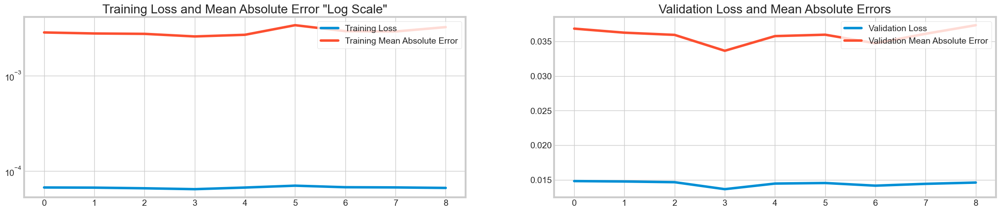

In [210]:
loss = history_fit.history['loss']
mae = history_fit.history['mean_absolute_error']
val_loss = history_fit.history['val_loss']
val_mae = history_fit.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [211]:
y_pred_fit = model_fit.predict(x_test)

3/3 [==============================] - 1s 5ms/step


In [212]:
test_pred_inverseFit = Scaler.inverse_transform(y_pred_fit)
test_true_inverseFit = Scaler.inverse_transform([y_test])

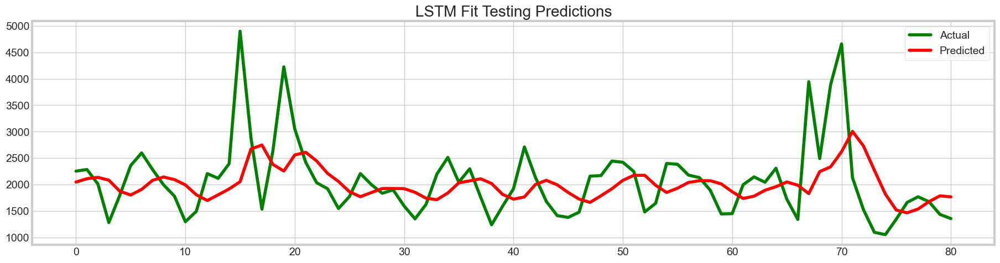

In [213]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseFit.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseFit.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Fit Testing Predictions")
plt.legend()
plt.show()

In [214]:
test_error_fit = smape(test_true_inverseFit.reshape(-1,1), test_pred_inverseFit.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_fit}')

SMAPE
Test Error: 23.089799209238862


In [215]:
model_fit1 = Sequential([
    LSTM(20, input_shape=(8,1), return_sequences=True),
    Dropout(0.2),
    LSTM(10, return_sequences=True),
    Dropout(0.2),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [216]:
model_fit1.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_34 (LSTM)              (None, 8, 20)             1760      
                                                                 
 dropout_4 (Dropout)         (None, 8, 20)             0         
                                                                 
 lstm_35 (LSTM)              (None, 8, 10)             1240      
                                                                 
 dropout_5 (Dropout)         (None, 8, 10)             0         
                                                                 
 lstm_36 (LSTM)              (None, 8)                 608       
                                                                 
 dense_15 (Dense)            (None, 1)                 9         
                                                                 
Total params: 3,617
Trainable params: 3,617
Non-train

In [217]:
model_checkpoint_fit1 = ModelCheckpoint('./weights/model_LSTMFit1.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [218]:
model_fit1.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [219]:
history_fit1 = model_fit1.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=30, batch_size=4, callbacks=[early_stopping, model_checkpoint_fit1])

Epoch 1/30
95/95 [==============================] - ETA: 0s - loss: 9.2103e-05 - mean_absolute_error: 0.0038
Epoch 1: val_mean_absolute_error improved from inf to 0.06570, saving model to ./weights\model_LSTMFit1.h5
95/95 [==============================] - 8s 28ms/step - loss: 9.2103e-05 - mean_absolute_error: 0.0038 - val_loss: 0.0303 - val_mean_absolute_error: 0.0657
Epoch 2/30
94/95 [============================>.] - ETA: 0s - loss: 8.7259e-05 - mean_absolute_error: 0.0035
Epoch 2: val_mean_absolute_error improved from 0.06570 to 0.06463, saving model to ./weights\model_LSTMFit1.h5
95/95 [==============================] - 1s 15ms/step - loss: 8.6349e-05 - mean_absolute_error: 0.0035 - val_loss: 0.0299 - val_mean_absolute_error: 0.0646
Epoch 3/30
95/95 [==============================] - ETA: 0s - loss: 8.6769e-05 - mean_absolute_error: 0.0035
Epoch 3: val_mean_absolute_error improved from 0.06463 to 0.06277, saving model to ./weights\model_LSTMFit1.h5
95/95 [=========================

In [220]:
y_pred_fit1 = model_fit1.predict(x_test)

3/3 [==============================] - 1s 10ms/step


In [221]:
test_pred_inverseFit1 = Scaler.inverse_transform(y_pred_fit1)
test_true_inverseFit1 = Scaler.inverse_transform([y_test])

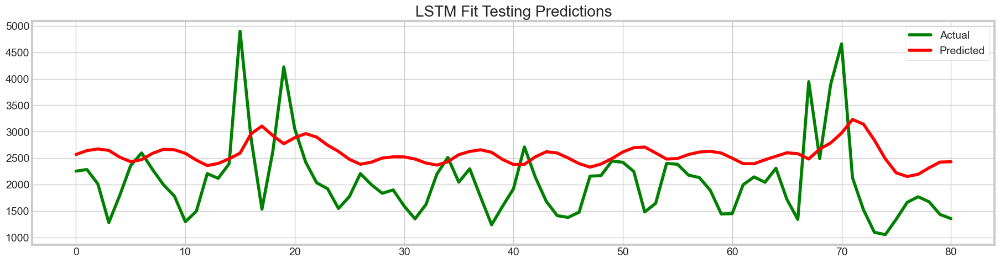

In [222]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseFit1.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseFit1.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Fit Testing Predictions")
plt.legend()
plt.show()

In [223]:
test_error_fit1 = smape(test_true_inverseFit1.reshape(-1,1), test_pred_inverseFit1.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_fit1}')

SMAPE
Test Error: 31.928910015659362


In [239]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import regularizers

In [254]:
model_fit_2 = Sequential([
    LSTM(20, 
         input_shape=(8,1),
         dropout=0.2,
         recurrent_dropout=0.2,
         return_sequences=True),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [255]:
model_fit_2.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_46 (LSTM)              (None, 8, 20)             1760      
                                                                 
 lstm_47 (LSTM)              (None, 8)                 928       
                                                                 
 dense_20 (Dense)            (None, 1)                 9         
                                                                 
Total params: 2,697
Trainable params: 2,697
Non-trainable params: 0
_________________________________________________________________


In [256]:
model_checkpoint_fit2 = ModelCheckpoint('./weights/model_LSTMFit2+-.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [257]:
model_fit_2.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [258]:
history_fit_2 = model_fit_2.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint_fit2])

Epoch 1/20
95/95 [==============================] - ETA: 0s - loss: 9.2812e-05 - mean_absolute_error: 0.0044
Epoch 1: val_mean_absolute_error improved from inf to 0.05529, saving model to ./weights\model_LSTMFit2+-.h5
95/95 [==============================] - 5s 19ms/step - loss: 9.2812e-05 - mean_absolute_error: 0.0044 - val_loss: 0.0265 - val_mean_absolute_error: 0.0553
Epoch 2/20
94/95 [============================>.] - ETA: 0s - loss: 8.4537e-05 - mean_absolute_error: 0.0033
Epoch 2: val_mean_absolute_error improved from 0.05529 to 0.05130, saving model to ./weights\model_LSTMFit2+-.h5
95/95 [==============================] - 1s 11ms/step - loss: 8.3709e-05 - mean_absolute_error: 0.0033 - val_loss: 0.0249 - val_mean_absolute_error: 0.0513
Epoch 3/20
91/95 [===========================>..] - ETA: 0s - loss: 1.8982e-05 - mean_absolute_error: 0.0024
Epoch 3: val_mean_absolute_error improved from 0.05130 to 0.04849, saving model to ./weights\model_LSTMFit2+-.h5
95/95 [===================

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

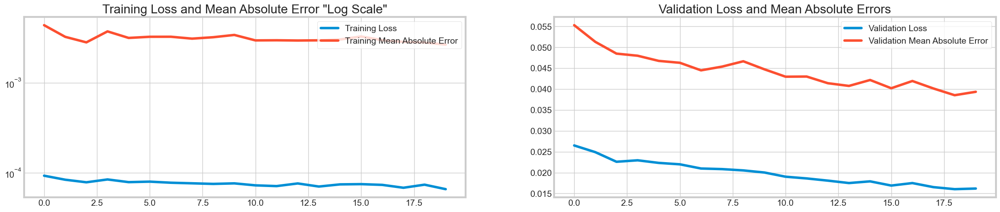

In [259]:
loss = history_fit_2.history['loss']
mae = history_fit_2.history['mean_absolute_error']
val_loss = history_fit_2.history['val_loss']
val_mae = history_fit_2.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [260]:
y_pred_fit2 = model_fit_2.predict(x_test)

3/3 [==============================] - 1s 4ms/step


In [261]:
test_pred_inverseFit2 = Scaler.inverse_transform(y_pred_fit2)
test_true_inverseFit2 = Scaler.inverse_transform([y_test])

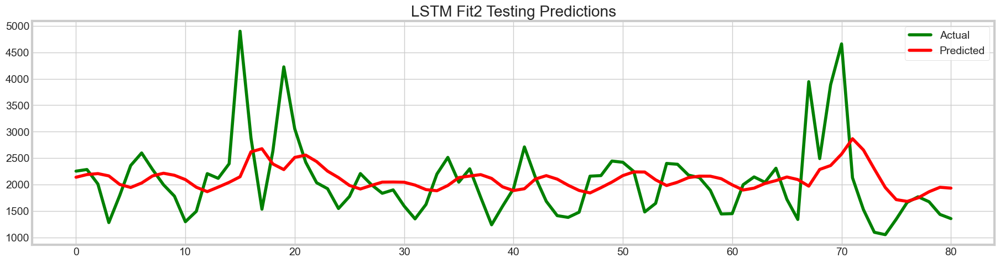

In [930]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseFit2.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseFit2.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Fit2 Testing Predictions")
plt.legend()
plt.show()

In [263]:
test_error_fit2 = smape(test_true_inverseFit2.reshape(-1,1), test_pred_inverseFit2.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_fit2}')

SMAPE
Test Error: 22.712373714820256


In [264]:
model_fit3 = Sequential([
    LSTM(20, 
         input_shape=(8,1),
         dropout=0.3,
         recurrent_dropout=0.3,
         return_sequences=True),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [265]:
model_fit3.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_48 (LSTM)              (None, 8, 20)             1760      
                                                                 
 lstm_49 (LSTM)              (None, 8)                 928       
                                                                 
 dense_21 (Dense)            (None, 1)                 9         
                                                                 
Total params: 2,697
Trainable params: 2,697
Non-trainable params: 0
_________________________________________________________________


In [266]:
model_checkpoint_fit3 = ModelCheckpoint('./weights/model_LSTMFit3.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [267]:
model_fit3.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [268]:
history_fit3 = model_fit3.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint_fit3])

Epoch 1/20
90/95 [===========================>..] - ETA: 0s - loss: 9.2727e-05 - mean_absolute_error: 0.0040
Epoch 1: val_mean_absolute_error improved from inf to 0.05246, saving model to ./weights\model_LSTMFit3.h5
95/95 [==============================] - 6s 38ms/step - loss: 9.0181e-05 - mean_absolute_error: 0.0040 - val_loss: 0.0254 - val_mean_absolute_error: 0.0525
Epoch 2/20
95/95 [==============================] - ETA: 0s - loss: 8.6009e-05 - mean_absolute_error: 0.0039
Epoch 2: val_mean_absolute_error improved from 0.05246 to 0.05214, saving model to ./weights\model_LSTMFit3.h5
95/95 [==============================] - 2s 22ms/step - loss: 8.6009e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0249 - val_mean_absolute_error: 0.0521
Epoch 3/20
92/95 [============================>.] - ETA: 0s - loss: 8.0582e-05 - mean_absolute_error: 0.0033
Epoch 3: val_mean_absolute_error improved from 0.05214 to 0.04851, saving model to ./weights\model_LSTMFit3.h5
95/95 [=========================

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

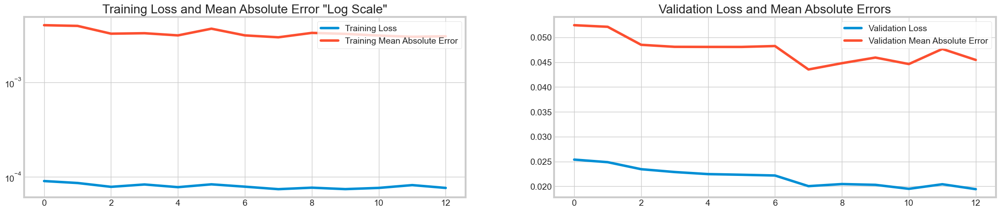

In [269]:
loss = history_fit3.history['loss']
mae = history_fit3.history['mean_absolute_error']
val_loss = history_fit3.history['val_loss']
val_mae = history_fit3.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [270]:
y_pred_fit3 = model_fit3.predict(x_test)

3/3 [==============================] - 1s 8ms/step


In [271]:
test_pred_inverseFit3 = Scaler.inverse_transform(y_pred_fit3)
test_true_inverseFit3 = Scaler.inverse_transform([y_test])

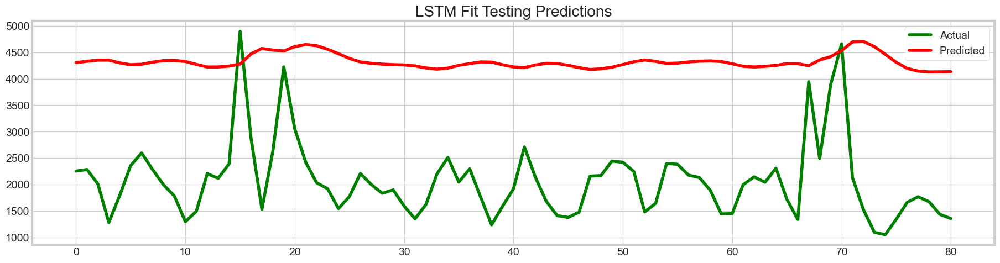

In [272]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseFit3.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseFit3.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Fit Testing Predictions")
plt.legend()
plt.show()

In [273]:
test_error_fit3 = smape(test_true_inverseFit3.reshape(-1,1), test_pred_inverseFit3.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_fit3}')

SMAPE
Test Error: 73.72041097129811


In [274]:
model_fit4 = Sequential([
    LSTM(20, 
         input_shape=(8,1),
         dropout=0.1,
         recurrent_dropout=0.1,
         return_sequences=True),
    LSTM(8, return_sequences = False),
    Dense(1)
])

In [275]:
model_fit4.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_50 (LSTM)              (None, 8, 20)             1760      
                                                                 
 lstm_51 (LSTM)              (None, 8)                 928       
                                                                 
 dense_22 (Dense)            (None, 1)                 9         
                                                                 
Total params: 2,697
Trainable params: 2,697
Non-trainable params: 0
_________________________________________________________________


In [276]:
model_checkpoint_fit4 = ModelCheckpoint('./weights/model_LSTMFit4.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [277]:
model_fit4.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [278]:
history_fit4 = model_fit4.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpoint_fit4])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 8.5673e-05 - mean_absolute_error: 0.0039
Epoch 1: val_mean_absolute_error improved from inf to 0.05210, saving model to ./weights\model_LSTMFit4.h5
95/95 [==============================] - 6s 33ms/step - loss: 8.4780e-05 - mean_absolute_error: 0.0039 - val_loss: 0.0244 - val_mean_absolute_error: 0.0521
Epoch 2/20
92/95 [============================>.] - ETA: 0s - loss: 8.0692e-05 - mean_absolute_error: 0.0033
Epoch 2: val_mean_absolute_error improved from 0.05210 to 0.05090, saving model to ./weights\model_LSTMFit4.h5
95/95 [==============================] - 2s 18ms/step - loss: 7.8273e-05 - mean_absolute_error: 0.0032 - val_loss: 0.0234 - val_mean_absolute_error: 0.0509
Epoch 3/20
95/95 [==============================] - ETA: 0s - loss: 8.1882e-05 - mean_absolute_error: 0.0036
Epoch 3: val_mean_absolute_error improved from 0.05090 to 0.04799, saving model to ./weights\model_LSTMFit4.h5
95/95 [=========================

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

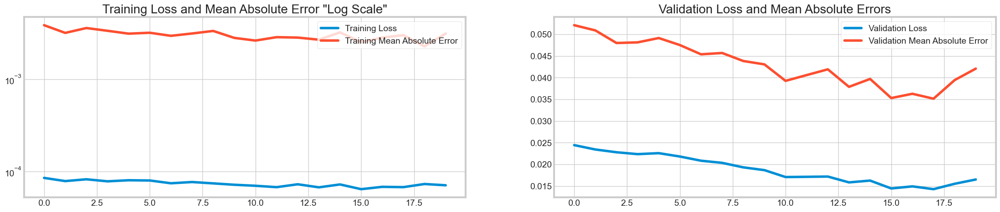

In [279]:
loss = history_fit4.history['loss']
mae = history_fit4.history['mean_absolute_error']
val_loss = history_fit4.history['val_loss']
val_mae = history_fit4.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [280]:
y_pred_fit4 = model_fit4.predict(x_test)

3/3 [==============================] - 1s 13ms/step


In [281]:
test_pred_inverseFit4 = Scaler.inverse_transform(y_pred_fit4)
test_true_inverseFit4 = Scaler.inverse_transform([y_test])

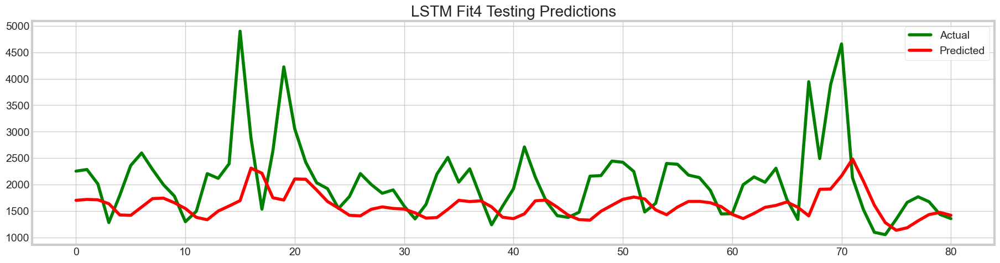

In [282]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseFit4.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseFit4.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Fit4 Testing Predictions")
plt.legend()
plt.show()

In [283]:
test_error_fit4 = smape(test_true_inverseFit4.reshape(-1,1), test_pred_inverseFit4.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_fit4}')

SMAPE
Test Error: 27.827276246851074


<br></br>
<h3>Let's use some Pre-Trained Models:</h3>

**Let's use XGBoost**

In [335]:
from xgboost import XGBRegressor

In [525]:
model_XG = XGBRegressor(objective='reg:squarederror', n_estimators=1000)

In [570]:
xg_row = m_data.iloc[11636, :].values
xg_row

array([  1764.,   1279.,   1117.,   1040.,   1122.,   1554.,   1607.,
         1725.,   1843.,   1417.,   1514.,   1541.,   1735.,   1623.,
         1819.,   1886.,   1573.,   1302.,   1451.,   1720.,   2234.,
         1549.,   1622.,   1669.,   1803.,   1827.,   1813.,   1726.,
         1602.,   1756.,   1978.,   1410.,   2132.,   3100.,   4079.,
         4878.,   7096.,   4724.,   7137.,   7809.,   6625.,   3886.,
         3062.,   2450.,   2912.,   2055.,   2658.,   2446.,   1803.,
         1962.,   1554.,   1383.,   1532.,   1926.,   3095.,   1990.,
         1861.,   2751.,   2184.,   1822.,   1709.,   1746.,   1536.,
         1753.,   1662.,   1490.,   1132.,   1159.,   1366.,   1435.,
         1526.,   1730.,   1353.,   1032.,   1137.,   1500.,   1424.,
         1494.,   1429.,   1308.,    870.,   1307.,   1509.,   1417.,
         1380.,   1411.,   1124.,    922.,   1048.,   1312.,   1350.,
         1403.,   1345.,   1268.,    904.,   1098.,   1723.,   1547.,
         1616.,   14

In [571]:
Xg_train, yg_train = create_dataset(xg_row.reshape(-1, 1), look_back = 8)

In [572]:
train_sizexg = int(ceil(len(Xg_train) * 0.70))
val_sizexg = int(ceil(len(Xg_train) * 0.85))

x_trainxg = Xg_train[0:train_sizexg]
x_valxg = Xg_train[train_sizexg:val_sizexg]
x_testxg = Xg_train[val_sizexg:]


target_trainxg = int(ceil(len(yg_train) * 0.70))
target_valxg = int(ceil(len(yg_train) * 0.85))

y_trainxg = yg_train[0:target_trainxg]
y_valxg = yg_train[target_trainxg:target_valxg]
y_testxg = yg_train[target_valxg:]

In [573]:
x_testxg.shape

(81, 8)

In [574]:
model_XG.fit(x_trainxg, y_trainxg)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [575]:
y_pred_XG = model_XG.predict(x_testxg)

In [576]:
y_pred_XG

array([2235.919 , 2535.7612, 1933.1979, 1949.4128, 1607.3153, 1806.9915,
       2363.7544, 2757.7605, 2690.2095, 1345.2618, 1842.1843, 1319.4684,
       1675.6448, 2552.1606, 2669.3418, 2200.9219, 4188.7144, 2309.1228,
       1918.4423, 2443.1812, 3906.8843, 2610.7073, 2757.651 , 1771.839 ,
       2200.0198, 1574.7964, 2239.3123, 2279.5923, 2049.4646, 1649.0233,
       2102.264 , 1549.4644, 1508.5161, 1849.1803, 2683.1948, 2010.6664,
       1986.0406, 2270.6729, 1440.6018, 1575.9856, 1823.1686, 2652.4636,
       3303.737 , 1945.4409, 1242.8685, 1280.5908, 1722.9574, 1874.7433,
       2554.7463, 2163.9978, 2097.11  , 1944.1766, 1960.0779, 1504.7307,
       1508.8417, 2203.28  , 1848.9789, 2010.3678, 1564.5253, 1747.0867,
       1640.9718, 1908.8435, 2474.066 , 2528.2905, 1854.3221, 2176.9646,
       1318.9578, 1587.372 , 7761.417 , 2524.4226, 4091.3787, 4111.763 ,
       1642.1268, 1522.2225, 1849.3418, 1874.6199, 1950.2594, 2060.1404,
       2150.3477, 1360.9154, 1243.7876], dtype=floa

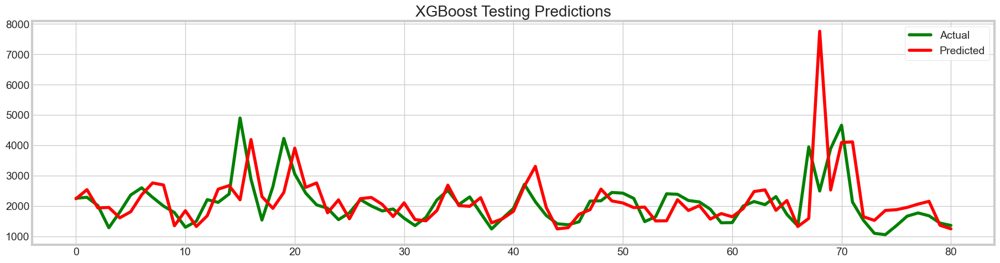

In [577]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(y_testxg, color='green', label='Actual')
predicted = plt.plot(y_pred_XG, color='red', label='Predicted')
plt.title("XGBoost Testing Predictions")
plt.legend()
plt.show()

In [578]:
test_error_XG = smape(y_testxg, y_pred_XG)

print('SMAPE')
print(f'Test Error: {test_error_XG}')

SMAPE
Test Error: 21.415086670925067


In [579]:
model_XG1 = XGBRegressor(objective='reg:squarederror', n_estimators = 1000)

In [580]:
model_XG1.fit(x_trainxg, y_trainxg, eval_set=[(x_valxg, y_valxg)], early_stopping_rounds=10)

[0]	validation_0-rmse:78381.72095
[1]	validation_0-rmse:77551.52209
[2]	validation_0-rmse:76898.90002
[3]	validation_0-rmse:75142.56633
[4]	validation_0-rmse:74834.74029
[5]	validation_0-rmse:74589.19865
[6]	validation_0-rmse:74393.91049
[7]	validation_0-rmse:74208.08549
[8]	validation_0-rmse:74050.37525
[9]	validation_0-rmse:73915.93398
[10]	validation_0-rmse:73801.92621
[11]	validation_0-rmse:73705.34490
[12]	validation_0-rmse:73623.64945
[13]	validation_0-rmse:73554.85935
[14]	validation_0-rmse:73495.87641
[15]	validation_0-rmse:73445.98856
[16]	validation_0-rmse:73403.72607
[17]	validation_0-rmse:73367.86948
[18]	validation_0-rmse:73337.37712
[19]	validation_0-rmse:73311.39940
[20]	validation_0-rmse:73289.39645
[21]	validation_0-rmse:73270.71076
[22]	validation_0-rmse:73254.80117
[23]	validation_0-rmse:73241.20598
[24]	validation_0-rmse:73229.70723
[25]	validation_0-rmse:73219.74940
[26]	validation_0-rmse:73211.47036
[27]	validation_0-rmse:73204.51178
[28]	validation_0-rmse:73196.5

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [581]:
y_predxg1 = model_XG1.predict(x_testxg)

In [582]:
y_predxg1

array([2266.9778, 2477.4402, 1853.9967, 2006.4054, 1613.977 , 1864.2656,
       2375.2058, 2709.4346, 2468.3618, 1466.4828, 1821.7571, 1324.5382,
       1623.9376, 2645.8777, 2590.912 , 2017.8102, 4219.853 , 2286.8132,
       1758.784 , 2484.1167, 3974.2485, 2576.873 , 2633.05  , 1877.9622,
       2233.3726, 1561.2858, 2190.4211, 2352.0955, 2022.345 , 1600.7902,
       2168.8054, 1616.8165, 1481.8054, 1847.0737, 2734.683 , 2085.64  ,
       1906.3488, 2192.474 , 1491.0385, 1561.4562, 1784.8666, 2523.247 ,
       3137.5786, 1864.8507, 1252.2035, 1280.8773, 1714.5936, 1770.6829,
       2498.4832, 2065.6436, 1924.3855, 1934.5055, 1990.9872, 1435.8573,
       1559.7303, 2275.1545, 1939.8853, 1926.4983, 1632.2424, 1729.4481,
       1659.0386, 1751.4646, 2460.7593, 2470.1064, 1726.5195, 2077.8499,
       1369.7959, 1535.9293, 7809.7837, 2553.4329, 4051.9458, 3989.1636,
       1724.306 , 1534.2831, 1828.038 , 1822.4518, 1893.8082, 1982.3591,
       2205.8508, 1451.85  , 1244.9396], dtype=floa

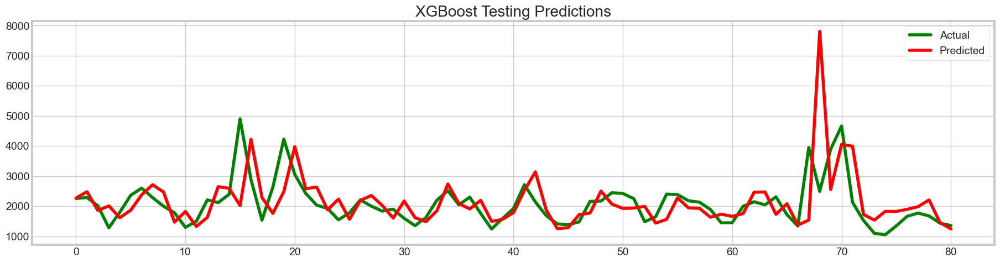

In [583]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(y_testxg, color='green', label='Actual')
predicted = plt.plot(y_predxg1, color='red', label='Predicted')
plt.title("XGBoost Testing Predictions")
plt.legend()
plt.show()

In [673]:
test_error_XG1 = smape(y_testxg, y_predxg1)

print('SMAPE')
print(f'Test Error: {test_error_XG1}')

SMAPE
Test Error: 21.691408078521743


In [932]:
table = {
    "Model Type": [
        "LSTM 20*8, Dense with 1 neuron", "LSTM_Fit 20*8, 1 Dropuout, 1 Dense", "XGBoost"
    ],
    "SMAPE Error": [
        "22.62", "22.71", "21.69"
    ]
}

In [935]:
table_df = pd.DataFrame(table)

table_df.to_csv("LSTM_models1.csv", index=False)

print("Single page data Models:")
pd.DataFrame(table_df)

Single page data Models:


,Model Type,SMAPE Error
0,"LSTM 20*8, Dense with 1 neuron",22.62
1,"LSTM_Fit 20*8, 1 Dropuout, 1 Dense",22.71
2,XGBoost,21.69


<br></br>
<h3>Another Approach</h3>

In this approach, I'm taking all the english pages(replacing the data with the mean value) to predict future values.

<br></br>
<h2>Step 1</h2>

<h4>Overfitting the data: </h4>

**Adding output feature to input:**

Tried overfitting data using different architectures but unable to overfit, only reached Mean Absolute Error upto 0.43. So tried adding output feature to input feature to overfit the model.

In [1009]:
english_df.head()

Date
2015-07-01    2668.558717
2015-07-02    2641.819845
2015-07-03    2513.533870
2015-07-04    2614.326088
2015-07-05    2714.005393
Name: Visits, dtype: float64

In [74]:
Scaler = MinMaxScaler()
en_scaled_data = Scaler.fit_transform(np.array(english_df).reshape(-1, 1))

In [75]:
en_scaled_data[:5]

array([[0.05953701],
       [0.05294367],
       [0.02131059],
       [0.04616419],
       [0.07074337]])

In [78]:
en_X, en_y = create_dataset(en_scaled_data.reshape(-1, 1), look_back = 10)

In [112]:
en_y.shape

(540,)

In [80]:
en_y_new = en_y.reshape(-1, 1)

In [1015]:
en_X_new = np.hstack((en_X, en_y))

In [1016]:
en_X_new.shape

(540, 11)

In [1017]:
en_X[0]

array([0.05953701, 0.05294367, 0.02131059, 0.04616419, 0.07074337,
       0.12023212, 0.08302431, 0.05382266, 0.06438661, 0.05735513])

In [1019]:
en_X_new.shape

(540, 11)

In [1021]:
en_X_new = np.reshape(en_X_new, (en_X_new.shape[0], 11, 1))

In [114]:
from math import ceil

train_size_en = int(ceil(len(en_X) * 0.70))
val_size_en = int(ceil(len(en_X) * 0.85))

x_train_en = en_X[0:train_size_en]
x_val_en = en_X[train_size_en:val_size_en]
x_test_en = en_X[val_size_en:]

In [115]:
target_train_en = int(ceil(len(en_y) * 0.70))
target_val_en = int(ceil(len(en_y) * 0.85))

y_train_en = en_y[0:target_train_en]
y_val_en = en_y[target_train_en:target_val_en]
y_test_en = en_y[target_val_en:]

In [116]:
# Reshape the data for the lstm model
x_train_en = np.reshape(x_train_en, (x_train_en.shape[0], 10, 1))
x_val_en = np.reshape(x_val_en, (x_val_en.shape[0], 10, 1))
x_test_en = np.reshape(x_test_en, (x_test_en.shape[0], 10, 1))

In [93]:
y_train_en.shape

(378, 1)

In [965]:
overfitX = np.reshape(en_X, (en_X.shape[0], 10, 1))

In [968]:
overfitX.shape

(540, 10, 1)

In [1023]:
modelEN_LSTM0 = Sequential([
    LSTM(128, input_shape=(11,1), return_sequences=False),
    Dense(8),
    Dense(1)
])

In [1024]:
modelEN_LSTM0.summary()

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_81 (LSTM)              (None, 128)               66560     
                                                                 
 dense_44 (Dense)            (None, 8)                 1032      
                                                                 
 dense_45 (Dense)            (None, 1)                 9         
                                                                 
Total params: 67,601
Trainable params: 67,601
Non-trainable params: 0
_________________________________________________________________


In [1025]:
modelEN_LSTM0.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [1030]:
historyEN_LSTM0 = modelEN_LSTM0.fit(en_X_new, en_y_new, epochs=50, batch_size=1)

Epoch 1/50
540/540 [==============================] - 4s 8ms/step - loss: 8.7092e-06 - mean_absolute_error: 0.0015
Epoch 2/50
540/540 [==============================] - 4s 8ms/step - loss: 2.3127e-05 - mean_absolute_error: 0.0032
Epoch 3/50
540/540 [==============================] - 4s 8ms/step - loss: 7.3613e-06 - mean_absolute_error: 0.0019
Epoch 4/50
540/540 [==============================] - 4s 8ms/step - loss: 9.6751e-05 - mean_absolute_error: 0.0051
Epoch 5/50
540/540 [==============================] - 4s 8ms/step - loss: 1.0111e-05 - mean_absolute_error: 0.0022
Epoch 6/50
540/540 [==============================] - 4s 8ms/step - loss: 1.8188e-05 - mean_absolute_error: 0.0023
Epoch 7/50
540/540 [==============================] - 4s 8ms/step - loss: 8.1163e-06 - mean_absolute_error: 0.0017
Epoch 8/50
540/540 [==============================] - 4s 8ms/step - loss: 6.8443e-06 - mean_absolute_error: 0.0019
Epoch 9/50
540/540 [==============================] - 4s 8ms/step - loss: 1.3245

Text(0.5, 1.0, 'Training Loss and Mean Absolute Error')

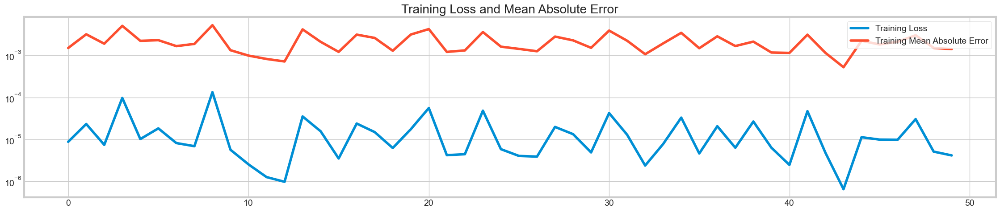

In [1034]:
loss = historyEN_LSTM0.history['loss']
mae = historyEN_LSTM0.history['mean_absolute_error']
# val_loss = historyEN_LSTM0.history['val_loss']
# val_mae = historyEN_LSTM0.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,1,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error')

<br></br>
<h3>Step 2</h3>

**Finding best model:**

In [796]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

modelEN_LSTM = Sequential([
    LSTM(20, input_shape=(10,1), return_sequences=False),
    Dense(1)
])

In [798]:
modelEN_LSTM.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_52 (LSTM)              (None, 20)                1760      
                                                                 
 dense_23 (Dense)            (None, 1)                 21        
                                                                 
Total params: 1,781
Trainable params: 1,781
Non-trainable params: 0
_________________________________________________________________


In [799]:
modelEN_LSTM.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [800]:
model_checkpointEN = ModelCheckpoint('./weights/modelEN_LSTM.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [801]:
historyEN_LSTM = modelEN_LSTM.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpointEN])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.0775
Epoch 1: val_mean_absolute_error improved from inf to 0.12222, saving model to ./weights\modelEN_LSTM.h5
95/95 [==============================] - 8s 27ms/step - loss: 0.0114 - mean_absolute_error: 0.0774 - val_loss: 0.0257 - val_mean_absolute_error: 0.1222
Epoch 2/20
95/95 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.0507
Epoch 2: val_mean_absolute_error improved from 0.12222 to 0.11543, saving model to ./weights\modelEN_LSTM.h5
95/95 [==============================] - 1s 13ms/step - loss: 0.0053 - mean_absolute_error: 0.0507 - val_loss: 0.0229 - val_mean_absolute_error: 0.1154
Epoch 3/20
94/95 [============================>.] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.0485
Epoch 3: val_mean_absolute_error improved from 0.11543 to 0.11328, saving model to ./weights\modelEN_LSTM.h5
95/95 [==============================] - 1s 12ms/step - lo

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

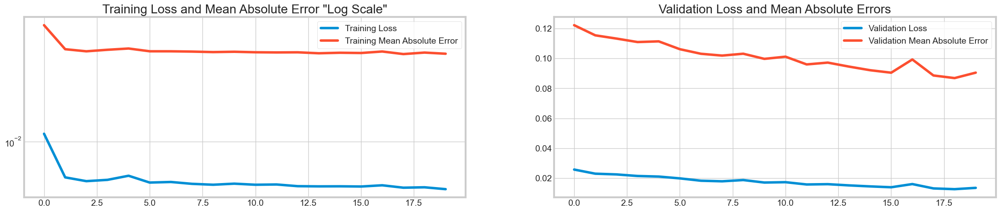

In [802]:
loss = historyEN_LSTM.history['loss']
mae = historyEN_LSTM.history['mean_absolute_error']
val_loss = historyEN_LSTM.history['val_loss']
val_mae = historyEN_LSTM.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [803]:
y_pred_en = modelEN_LSTM.predict(x_test_en)

3/3 [==============================] - 1s 11ms/step


In [804]:
test_pred_inverseEN = Scaler.inverse_transform(y_pred_en)
test_true_inverseEN = Scaler.inverse_transform([y_test_en])

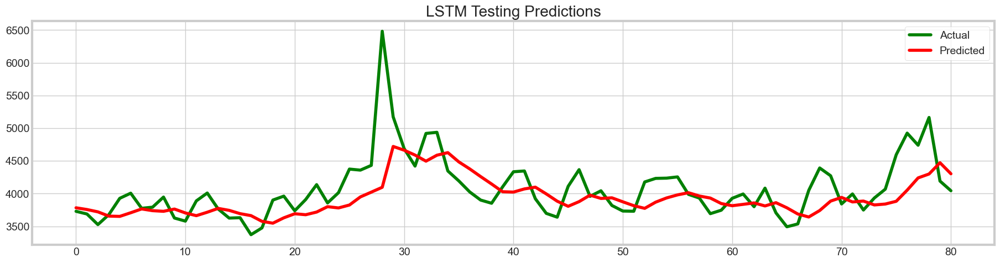

In [805]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [806]:
test_error_EN = smape(test_true_inverseEN.reshape(-1,1), test_pred_inverseEN.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN}')

SMAPE
Test Error: 6.563966235601406


In [131]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [143]:
model_en1 = Sequential([
    LSTM(20, input_shape=(10,1), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [144]:
model_en1.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 10, 20)            1760      
                                                                 
 lstm_13 (LSTM)              (None, 10)                1240      
                                                                 
 dense_6 (Dense)             (None, 1)                 11        
                                                                 
Total params: 3,011
Trainable params: 3,011
Non-trainable params: 0
_________________________________________________________________


In [145]:
model_en1.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [146]:
model_en1_checkpoint = ModelCheckpoint('./weights/model1_en.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [121]:
y_test_en.shape

(81,)

In [148]:
history_en1 = model_en1.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=30, batch_size=4, callbacks=[model_en1_checkpoint])

Epoch 1/30
94/95 [============================>.] - ETA: 0s - loss: 0.0044 - mean_absolute_error: 0.0475
Epoch 1: val_mean_absolute_error did not improve from 0.11299
95/95 [==============================] - 2s 19ms/step - loss: 0.0044 - mean_absolute_error: 0.0473 - val_loss: 0.0311 - val_mean_absolute_error: 0.1353
Epoch 2/30
93/95 [============================>.] - ETA: 0s - loss: 0.0044 - mean_absolute_error: 0.0464
Epoch 2: val_mean_absolute_error improved from 0.11299 to 0.10479, saving model to ./weights\model1_en.h5
95/95 [==============================] - 2s 20ms/step - loss: 0.0044 - mean_absolute_error: 0.0464 - val_loss: 0.0174 - val_mean_absolute_error: 0.1048
Epoch 3/30
93/95 [============================>.] - ETA: 0s - loss: 0.0043 - mean_absolute_error: 0.0475
Epoch 3: val_mean_absolute_error did not improve from 0.10479
95/95 [==============================] - 2s 18ms/step - loss: 0.0044 - mean_absolute_error: 0.0478 - val_loss: 0.0342 - val_mean_absolute_error: 0.1403

95/95 [==============================] - 2s 22ms/step - loss: 0.0034 - mean_absolute_error: 0.0388 - val_loss: 0.0136 - val_mean_absolute_error: 0.0882
Epoch 26/30
95/95 [==============================] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.0399
Epoch 26: val_mean_absolute_error did not improve from 0.08387
95/95 [==============================] - 2s 20ms/step - loss: 0.0034 - mean_absolute_error: 0.0399 - val_loss: 0.0163 - val_mean_absolute_error: 0.0963
Epoch 27/30
92/95 [============================>.] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.0396
Epoch 27: val_mean_absolute_error did not improve from 0.08387
95/95 [==============================] - 2s 19ms/step - loss: 0.0034 - mean_absolute_error: 0.0394 - val_loss: 0.0206 - val_mean_absolute_error: 0.1131
Epoch 28/30
93/95 [============================>.] - ETA: 0s - loss: 0.0035 - mean_absolute_error: 0.0393
Epoch 28: val_mean_absolute_error did not improve from 0.08387
95/95 [==============================

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

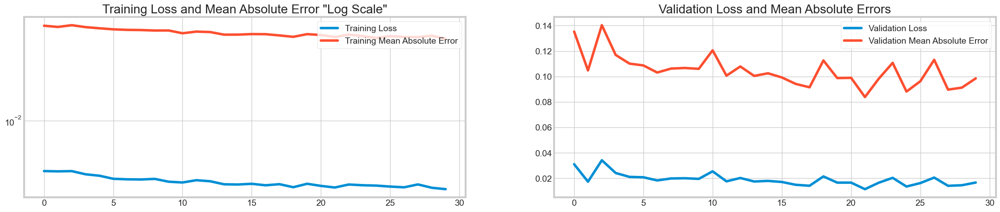

In [150]:
loss = history_en1.history['loss']
mae = history_en1.history['mean_absolute_error']
val_loss = history_en1.history['val_loss']
val_mae = history_en1.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [151]:
y_pred_en1 = model_en1.predict(x_test_en)

3/3 [==============================] - 1s 8ms/step


In [152]:
test_pred_inverseEN1 = Scaler.inverse_transform(y_pred_en1)
test_true_inverseEN1 = Scaler.inverse_transform([y_test_en])

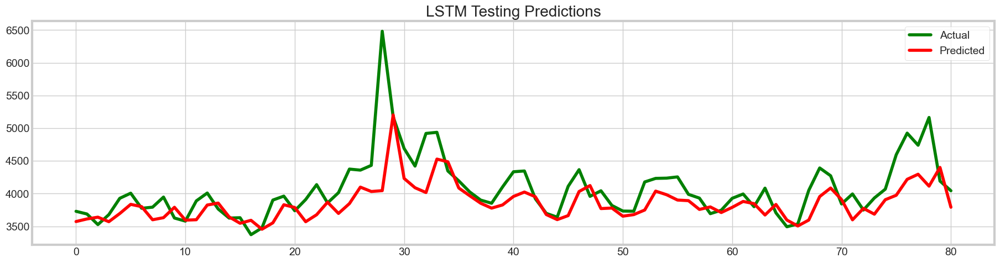

In [153]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN1.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN1.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [154]:
test_error_EN1 = smape(test_true_inverseEN1.reshape(-1,1), test_pred_inverseEN1.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN1}')

SMAPE
Test Error: 6.102497193082094


In [819]:
modelEN_LSTM2 = Sequential([
    LSTM(20, input_shape=(10,1), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(10),
    Dense(1)
])

In [820]:
modelEN_LSTM2.summary()

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_55 (LSTM)              (None, 10, 20)            1760      
                                                                 
 lstm_56 (LSTM)              (None, 10)                1240      
                                                                 
 dense_25 (Dense)            (None, 10)                110       
                                                                 
 dense_26 (Dense)            (None, 1)                 11        
                                                                 
Total params: 3,121
Trainable params: 3,121
Non-trainable params: 0
_________________________________________________________________


In [821]:
modelEN_LSTM2.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [822]:
model_checkpointEN2 = ModelCheckpoint('./weights/modelEN_LSTM2.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [823]:
historyEN_LSTM2 = modelEN_LSTM2.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=30, batch_size=4, callbacks=[early_stopping, model_checkpointEN2])

Epoch 1/30
95/95 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.0794
Epoch 1: val_mean_absolute_error improved from inf to 0.13394, saving model to ./weights\modelEN_LSTM2.h5
95/95 [==============================] - 12s 40ms/step - loss: 0.0126 - mean_absolute_error: 0.0794 - val_loss: 0.0304 - val_mean_absolute_error: 0.1339
Epoch 2/30
93/95 [============================>.] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.0540
Epoch 2: val_mean_absolute_error improved from 0.13394 to 0.12382, saving model to ./weights\modelEN_LSTM2.h5
95/95 [==============================] - 2s 21ms/step - loss: 0.0059 - mean_absolute_error: 0.0540 - val_loss: 0.0264 - val_mean_absolute_error: 0.1238
Epoch 3/30
94/95 [============================>.] - ETA: 0s - loss: 0.0054 - mean_absolute_error: 0.0515
Epoch 3: val_mean_absolute_error improved from 0.12382 to 0.12189, saving model to ./weights\modelEN_LSTM2.h5
95/95 [==============================] - 2s 20ms/step 

Text(0.5, 1.0, 'Validation Loss and Mean Absolute Errors')

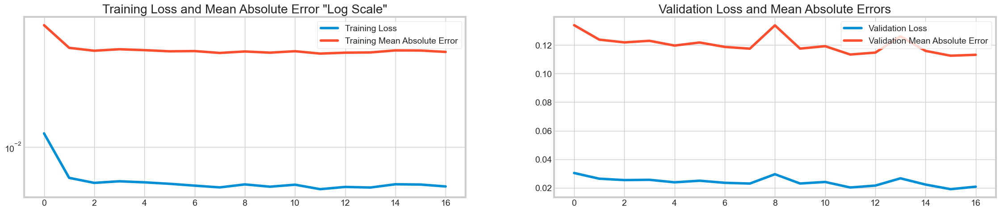

In [824]:
loss = historyEN_LSTM2.history['loss']
mae = historyEN_LSTM2.history['mean_absolute_error']
val_loss = historyEN_LSTM2.history['val_loss']
val_mae = historyEN_LSTM2.history['val_mean_absolute_error']

epochs_range = range(len(loss))

plt.figure(figsize = (25, 5))

plt.subplot(1,2,1)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, mae, label = 'Training Mean Absolute Error')
plt.yscale('log')
plt.legend(loc = 'upper right')
plt.title('Training Loss and Mean Absolute Error "Log Scale"')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.plot(epochs_range, val_mae, label = 'Validation Mean Absolute Error')
plt.legend(loc = 'upper right')
plt.title('Validation Loss and Mean Absolute Errors')

In [825]:
y_pred_en2 = modelEN_LSTM2.predict(x_test_en)

3/3 [==============================] - 2s 6ms/step


In [826]:
test_pred_inverseEN2 = Scaler.inverse_transform(y_pred_en2)
test_true_inverseEN2 = Scaler.inverse_transform([y_test_en])

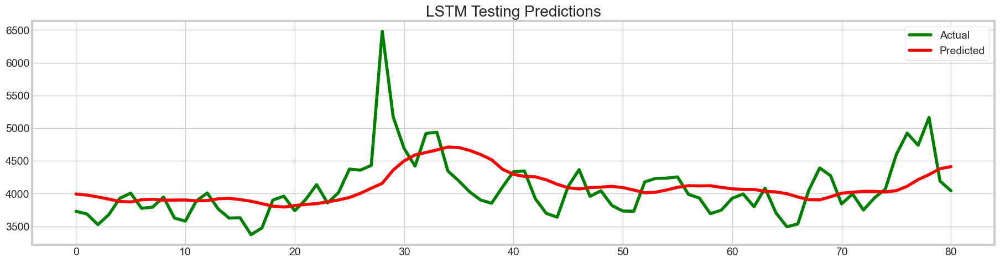

In [827]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN2.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN2.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [828]:
test_error_EN2 = smape(test_true_inverseEN2.reshape(-1,1), test_pred_inverseEN2.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN2}')

SMAPE
Test Error: 7.243026546175366


In [155]:
table2 = {
    "Fit model": [
        "LSTM 20, Dense 1", "LSTM 20, Dense 10*1", "LSTM 20*10, Dense 1"
    ],
    "SMAPE Error": [
        "6.56", "6.10", "7.24" 
    ]
}

In [156]:
table_df2 = pd.DataFrame(table2)

table_df2.to_csv("LSTM_Model Fit.csv", index=False)

# print("Taking Mean of all English pages data:")
pd.DataFrame(table_df2) 

,Fit model,SMAPE Error
0,"LSTM 20, Dense 1",6.56
1,"LSTM 20, Dense 10*1",6.10
2,"LSTM 20*10, Dense 1",7.24


<br></br>
<h3>Step 3</h3>

**Regularization:**

**Dropout:**

In [855]:
modelEN_LSTM5 = Sequential([
    LSTM(20, input_shape=(10,1), return_sequences=True),
    Dropout(0.2),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [856]:
modelEN_LSTM5.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [857]:
model_checkpointEN5 = ModelCheckpoint('./weights/modelEN_LSTM5.h5', monitor='val_mean_absolute_error', save_best_only=True, verbose=1)

In [858]:
historyEN_LSTM5 = modelEN_LSTM5.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=20, batch_size=4, callbacks=[early_stopping, model_checkpointEN5])

Epoch 1/20
94/95 [============================>.] - ETA: 0s - loss: 0.0148 - mean_absolute_error: 0.0840
Epoch 1: val_mean_absolute_error improved from inf to 0.14681, saving model to ./weights\modelEN_LSTM5.h5
95/95 [==============================] - 6s 26ms/step - loss: 0.0148 - mean_absolute_error: 0.0840 - val_loss: 0.0361 - val_mean_absolute_error: 0.1468
Epoch 2/20
95/95 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.0536
Epoch 2: val_mean_absolute_error improved from 0.14681 to 0.13186, saving model to ./weights\modelEN_LSTM5.h5
95/95 [==============================] - 2s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0536 - val_loss: 0.0295 - val_mean_absolute_error: 0.1319
Epoch 3/20
93/95 [============================>.] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.0522
Epoch 3: val_mean_absolute_error improved from 0.13186 to 0.13092, saving model to ./weights\modelEN_LSTM5.h5
95/95 [==============================] - 2s 19ms/step -

In [859]:
y_pred_en5 = modelEN_LSTM5.predict(x_test_en)

3/3 [==============================] - 1s 5ms/step


In [860]:
test_pred_inverseEN5 = Scaler.inverse_transform(y_pred_en5)
test_true_inverseEN5 = Scaler.inverse_transform([y_test_en])

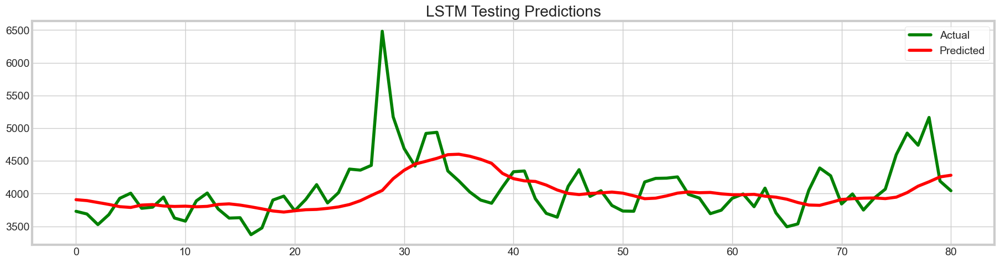

In [861]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN5.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN5.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [862]:
test_error_EN5 = smape(test_true_inverseEN5.reshape(-1,1), test_pred_inverseEN5.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN5}')

SMAPE
Test Error: 7.127791747112551


**BatchNormalization:**

In [863]:
modelEN_LSTM6 = Sequential([
    LSTM(20, input_shape=(10,1), return_sequences=True),
    BatchNormalization(),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [864]:
modelEN_LSTM6.summary()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_68 (LSTM)              (None, 10, 20)            1760      
                                                                 
 batch_normalization_3 (Batc  (None, 10, 20)           80        
 hNormalization)                                                 
                                                                 
 lstm_69 (LSTM)              (None, 10)                1240      
                                                                 
 dense_31 (Dense)            (None, 1)                 11        
                                                                 
Total params: 3,091
Trainable params: 3,051
Non-trainable params: 40
_________________________________________________________________


In [865]:
modelEN_LSTM6.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [866]:
historyEN_LSTM6 = modelEN_LSTM6.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=20, batch_size=4, callbacks=[early_stopping])

Epoch 1/20
95/95 [==============================] - 6s 25ms/step - loss: 0.0227 - mean_absolute_error: 0.0894 - val_loss: 0.1688 - val_mean_absolute_error: 0.3691
Epoch 2/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0542 - val_loss: 0.1737 - val_mean_absolute_error: 0.3770
Epoch 3/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0539 - val_loss: 0.1708 - val_mean_absolute_error: 0.3776
Epoch 4/20
95/95 [==============================] - 2s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0506 - val_loss: 0.1266 - val_mean_absolute_error: 0.3217
Epoch 5/20
95/95 [==============================] - 2s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0525 - val_loss: 0.0956 - val_mean_absolute_error: 0.2770
Epoch 6/20
95/95 [==============================] - 2s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0524 - val_loss: 0.0563 - val_mean_absolute_error: 0.1966
Epoch 7/20
95/95 [====

In [867]:
y_pred_en6 = modelEN_LSTM6.predict(x_test_en)

3/3 [==============================] - 1s 8ms/step


In [868]:
test_pred_inverseEN6 = Scaler.inverse_transform(y_pred_en6)
test_true_inverseEN6 = Scaler.inverse_transform([y_test_en])

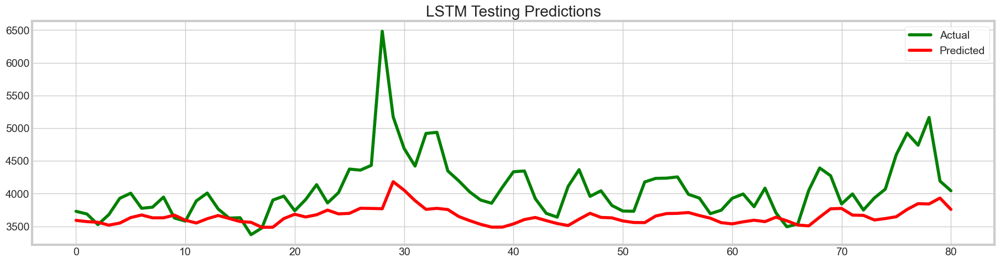

In [869]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN6.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN6.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [870]:
test_error_EN6 = smape(test_true_inverseEN6.reshape(-1,1), test_pred_inverseEN6.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN6}')

SMAPE
Test Error: 10.436399540345494


**L2 Regularizer:**

In [872]:
from tensorflow.keras.regularizers import l2

In [873]:
modelEN_LSTM7 = Sequential([
    LSTM(20, input_shape=(10,1), kernel_regularizer=l2(0.001), recurrent_regularizer=l2(0.001), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [874]:
modelEN_LSTM7.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_70 (LSTM)              (None, 10, 20)            1760      
                                                                 
 lstm_71 (LSTM)              (None, 10)                1240      
                                                                 
 dense_32 (Dense)            (None, 1)                 11        
                                                                 
Total params: 3,011
Trainable params: 3,011
Non-trainable params: 0
_________________________________________________________________


In [875]:
modelEN_LSTM7.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [876]:
historyEN_LSTM7 = modelEN_LSTM7.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=20, batch_size=4, callbacks=[early_stopping])

Epoch 1/20
95/95 [==============================] - 6s 25ms/step - loss: 0.0283 - mean_absolute_error: 0.0863 - val_loss: 0.0512 - val_mean_absolute_error: 0.1600
Epoch 2/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0116 - mean_absolute_error: 0.0560 - val_loss: 0.0317 - val_mean_absolute_error: 0.1289
Epoch 3/20
95/95 [==============================] - 2s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0524 - val_loss: 0.0296 - val_mean_absolute_error: 0.1278
Epoch 4/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0510 - val_loss: 0.0286 - val_mean_absolute_error: 0.1272
Epoch 5/20
95/95 [==============================] - 1s 15ms/step - loss: 0.0064 - mean_absolute_error: 0.0511 - val_loss: 0.0275 - val_mean_absolute_error: 0.1253
Epoch 6/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0513 - val_loss: 0.0291 - val_mean_absolute_error: 0.1284
Epoch 7/20
95/95 [====

In [877]:
y_pred_en7 = modelEN_LSTM7.predict(x_test_en)

3/3 [==============================] - 1s 4ms/step


In [878]:
test_pred_inverseEN7 = Scaler.inverse_transform(y_pred_en7)
test_true_inverseEN7 = Scaler.inverse_transform([y_test_en])

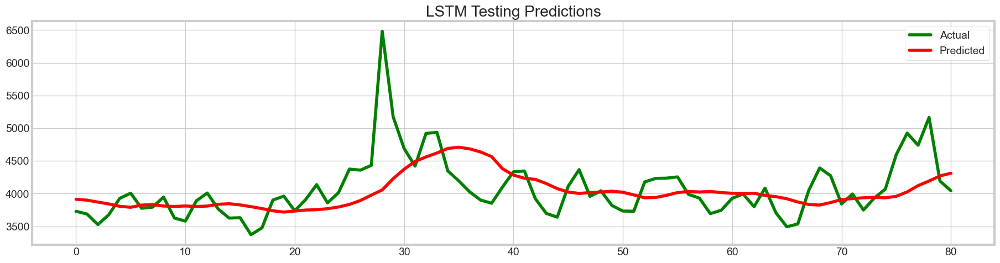

In [879]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN7.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN7.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [936]:
test_error_EN7 = smape(test_true_inverseEN7.reshape(-1,1), test_pred_inverseEN7.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN7}')

SMAPE
Test Error: 7.2741280543240805


In [880]:
modelEN_LSTM8 = Sequential([
    LSTM(25, input_shape=(10,1), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [881]:
modelEN_LSTM8.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [882]:
historyEN_LSTM8 = modelEN_LSTM8.fit(x_train_en, y_train_en, validation_data=(x_val_en, y_val_en), epochs=20, batch_size=4, callbacks=[early_stopping])

Epoch 1/20
95/95 [==============================] - 9s 25ms/step - loss: 0.0067 - mean_absolute_error: 0.0586 - val_loss: 0.0251 - val_mean_absolute_error: 0.1232
Epoch 2/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0052 - mean_absolute_error: 0.0508 - val_loss: 0.0247 - val_mean_absolute_error: 0.1216
Epoch 3/20
95/95 [==============================] - 2s 16ms/step - loss: 0.0051 - mean_absolute_error: 0.0499 - val_loss: 0.0235 - val_mean_absolute_error: 0.1192
Epoch 4/20
95/95 [==============================] - 2s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0507 - val_loss: 0.0247 - val_mean_absolute_error: 0.1230
Epoch 5/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0527 - val_loss: 0.0219 - val_mean_absolute_error: 0.1157
Epoch 6/20
95/95 [==============================] - 2s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0495 - val_loss: 0.0224 - val_mean_absolute_error: 0.1165
Epoch 7/20
95/95 [====

In [883]:
y_pred_en8 = modelEN_LSTM8.predict(x_test_en)

3/3 [==============================] - 1s 5ms/step


In [884]:
test_pred_inverseEN8 = Scaler.inverse_transform(y_pred_en8)
test_true_inverseEN8 = Scaler.inverse_transform([y_test_en])

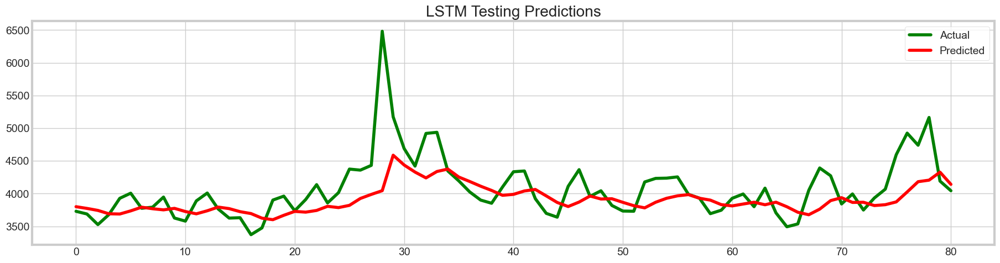

In [885]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_inverseEN8.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_inverseEN8.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Testing Predictions")
plt.legend()
plt.show()

In [886]:
test_error_EN8 = smape(test_true_inverseEN8.reshape(-1,1), test_pred_inverseEN8.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_EN8}')

SMAPE
Test Error: 6.4503874509285035


In [181]:
table3 = {
    "Regularization Type": [
        "NA(Base Fit model)", "Dropout(0.2)", "BatchNormalization", "L2 Regularizer"
    ],
    "SMAPE Error": [
        "6.10", "7.12", "10.43", "7.27" 
    ]
}

In [182]:
table_df3 = pd.DataFrame(table3)

table_df3.to_csv("LSTM_Regularizer.csv", index=False)

# print("Taking Mean of all English pages data:")
pd.DataFrame(table_df3) 

,Regularization Type,SMAPE Error
0,NA(Base Fit model),6.10
1,Dropout(0.2),7.12
2,BatchNormalization,10.43
3,L2 Regularizer,7.27


<br></br>
<h3>Step 4</h3>

<h4>Data Augmentation:</h4>

**Adding Noise:**

In [1063]:
english_df

Date
2015-07-01    2668.558717
2015-07-02    2641.819845
2015-07-03    2513.533870
2015-07-04    2614.326088
2015-07-05    2714.005393
                 ...     
2016-12-27    4924.368026
2016-12-28    4739.424773
2016-12-29    5163.799519
2016-12-30    4191.339362
2016-12-31    4043.401004
Name: Visits, Length: 550, dtype: float64

In [1064]:
type(english_df)

pandas.core.series.Series

In [1096]:
english_df.values

array([2668.55871738, 2641.81984486, 2513.53386983, 2614.32608786,
       2714.00539262, 2914.70390343, 2763.80997221, 2645.38453561,
       2688.22595097, 2659.71025013, 2700.10096652, 3030.08760941,
       2981.52573941, 3037.08362716, 2751.66296097, 2789.75729041,
       2667.93545443, 2573.65823205, 2759.81026258, 2877.37428963,
       2725.56838263, 2678.27996018, 2622.26071266, 2567.27278384,
       2545.77014975, 2739.37740075, 2807.62508815, 2764.99896296,
       3046.1979508 , 2515.98042062, 2432.18604555, 2427.11013399,
       2657.8774215 , 2481.4322396 , 2670.62641556, 2687.40116978,
       2701.83067159, 2806.96129755, 2627.94827229, 2762.87891484,
       2690.45351972, 2746.66553283, 2716.67797735, 2676.65304683,
       2631.04919733, 2635.3968142 , 2849.96440868, 2872.55245364,
       2752.14862903, 2659.13759489, 2658.83423902, 2598.60335172,
       2560.45667234, 2875.68905297, 2843.4097565 , 2724.22271539,
       2581.98817771, 2589.35105986, 2512.93964409, 2580.05525

**Noisy: 0.1**

In [1097]:
def add_noise(series, noise_factor):
    noise = np.random.randn(len(series)) * noise_factor
    return series + noise

# Example usage
noisy_series = add_noise(english_df.values, noise_factor = 0.1)

In [1100]:
noisy_series

array([2668.56141194, 2641.89514254, 2513.46423614, 2614.47632296,
       2714.03409466, 2914.78763655, 2764.01524053, 2645.37546382,
       2688.228137  , 2659.8192526 , 2700.00347379, 3030.11434807,
       2981.40356559, 3037.18411317, 2751.69735291, 2789.71993313,
       2667.93158799, 2573.79775378, 2759.78953117, 2877.20181369,
       2725.5797026 , 2678.32259935, 2622.2022554 , 2567.49172245,
       2545.79938935, 2739.50352007, 2807.57312015, 2765.02927151,
       3046.13641908, 2515.84563371, 2432.26763209, 2427.05475394,
       2657.95017181, 2481.31840952, 2670.55063308, 2687.29214504,
       2701.60376273, 2807.00314294, 2627.90974606, 2762.85161378,
       2690.41849229, 2746.64115552, 2716.81781364, 2676.5966415 ,
       2631.0406506 , 2635.52820522, 2849.99719486, 2872.50183963,
       2752.01953034, 2658.9941871 , 2658.90370398, 2598.54973313,
       2560.59171232, 2875.63005921, 2843.3581067 , 2724.20020975,
       2582.14263578, 2589.3695504 , 2512.89595991, 2579.94204

In [1101]:
scaler = MinMaxScaler()
scaled_warp = scaler.fit_transform(noisy_series.reshape(-1, 1))

In [1102]:
X_warp, y_warp = create_dataset(scaled_warp.reshape(-1, 1), look_back = 10)

In [1103]:
trainSize_warp = int(ceil(len(X_warp) * 0.70))
valSize_warp = int(ceil(len(X_warp) * 0.85))

x_train_warp = X_warp[0:trainSize_warp]
x_val_warp = X_warp[trainSize_warp:valSize_warp]
x_test_warp = X_warp[valSize_warp:]

In [1104]:
targetSize_warp = int(ceil(len(y_warp) * 0.70))
targetVal_warp = int(ceil(len(y_warp) * 0.85))

y_train_warp = y_warp[0:targetSize_warp]
y_val_warp = y_warp[targetSize_warp:targetVal_warp]
y_test_warp = y_warp[targetVal_warp:]

In [1105]:
# Reshape the data for the lstm model
x_train_warp = np.reshape(x_train_warp, (x_train_warp.shape[0], 10, 1))
x_val_warp = np.reshape(x_val_warp, (x_val_warp.shape[0], 10, 1))
x_test_warp = np.reshape(x_test_warp, (x_test_warp.shape[0], 10, 1))

In [1106]:
x_test_warp.shape

(81, 10, 1)

In [1107]:
model_aug1 = Sequential([
    LSTM(20, input_shape = (10, 1), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [1108]:
model_aug1.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [1110]:
history_aug1 = model_aug1.fit(x_train_warp, y_train_warp, validation_data=(x_val_warp, y_val_warp), epochs=30, batch_size=4, callbacks=[early_stopping])

Epoch 1/30
95/95 [==============================] - 2s 19ms/step - loss: 0.0049 - mean_absolute_error: 0.0480 - val_loss: 0.0188 - val_mean_absolute_error: 0.1081
Epoch 2/30
95/95 [==============================] - 2s 17ms/step - loss: 0.0050 - mean_absolute_error: 0.0501 - val_loss: 0.0198 - val_mean_absolute_error: 0.1105
Epoch 3/30
95/95 [==============================] - 2s 19ms/step - loss: 0.0048 - mean_absolute_error: 0.0488 - val_loss: 0.0200 - val_mean_absolute_error: 0.1108
Epoch 4/30
95/95 [==============================] - 2s 18ms/step - loss: 0.0048 - mean_absolute_error: 0.0485 - val_loss: 0.0218 - val_mean_absolute_error: 0.1153
Epoch 5/30
95/95 [==============================] - 2s 18ms/step - loss: 0.0048 - mean_absolute_error: 0.0491 - val_loss: 0.0237 - val_mean_absolute_error: 0.1196
Epoch 6/30
95/95 [==============================] - 2s 18ms/step - loss: 0.0046 - mean_absolute_error: 0.0482 - val_loss: 0.0203 - val_mean_absolute_error: 0.1117
Epoch 7/30
95/95 [====

In [1111]:
y_pred_aug1 = model_aug1.predict(x_test_warp)

3/3 [==============================] - 1s 5ms/step


In [1112]:
test_pred_warp = scaler.inverse_transform(y_pred_aug1)
test_true_warp = Scaler.inverse_transform([y_test_warp])

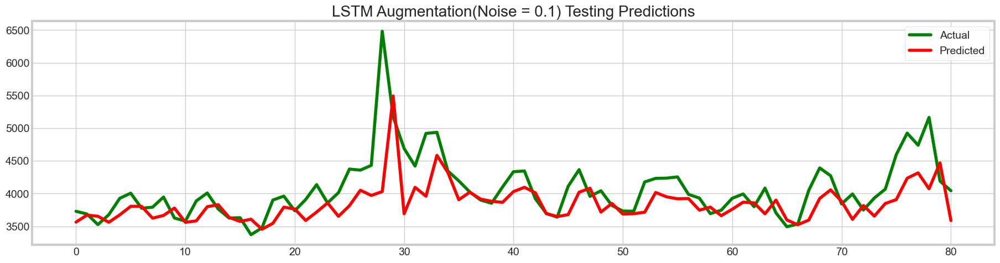

In [1130]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_warp.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_warp.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Augmentation(Noise = 0.1) Testing Predictions")
plt.legend()
plt.show()

In [1114]:
test_error_aug1 = smape(test_true_warp.reshape(-1,1), test_pred_warp.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_aug1}')

SMAPE
Test Error: 6.49924974415775


**Noisy: 0.4**

In [1187]:
def add_noise(series, noise_factor):
    noise = np.random.randn(len(series)) * noise_factor
    return series + noise

# Example usage
noise_series = add_noise(english_df.values, noise_factor = 0.4)

In [1188]:
scaler = MinMaxScaler()
scaled_noise = scaler.fit_transform(noise_series.reshape(-1, 1))

In [1189]:
noise_X, noise_y = create_dataset(scaled_noise.reshape(-1, 1), look_back = 10)

In [1190]:
trainSize_noisy = int(ceil(len(noise_X) * 0.70))
valSize_noisy = int(ceil(len(noise_X) * 0.85))

x_train_noise = noise_X[0:trainSize_noisy]
x_val_noise = noise_X[trainSize_noisy:valSize_noisy]
x_test_noise = noise_X[valSize_noisy:]

In [1191]:
targetSize_noisy = int(ceil(len(noise_y) * 0.70))
targetVal_noisy = int(ceil(len(noise_y) * 0.85))

y_train_noise = noise_y[0:targetSize_noisy]
y_val_noise = noise_y[targetSize_noisy:targetVal_noisy]
y_test_noise = noise_y[targetVal_noisy:]

In [1192]:
# Reshape the data for the lstm model
x_train_noise = np.reshape(x_train_noise, (x_train_noise.shape[0], 10, 1))
x_val_noise = np.reshape(x_val_noise, (x_val_noise.shape[0], 10, 1))
x_test_noise = np.reshape(x_test_noise, (x_test_noise.shape[0], 10, 1))

In [1193]:
y_train_noise.shape

(378,)

In [1194]:
model2_aug = Sequential([
    LSTM(20, input_shape = (10, 1), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [1196]:
model2_aug.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [1198]:
history2_aug = model2_aug.fit(x_train_noise, y_train_noise, validation_data=(x_val_noise, y_val_noise), epochs=20, batch_size=4)

Epoch 1/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0052 - mean_absolute_error: 0.0511 - val_loss: 0.0244 - val_mean_absolute_error: 0.1199
Epoch 2/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0053 - mean_absolute_error: 0.0505 - val_loss: 0.0232 - val_mean_absolute_error: 0.1163
Epoch 3/20
95/95 [==============================] - 2s 19ms/step - loss: 0.0052 - mean_absolute_error: 0.0524 - val_loss: 0.0266 - val_mean_absolute_error: 0.1265
Epoch 4/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0053 - mean_absolute_error: 0.0490 - val_loss: 0.0215 - val_mean_absolute_error: 0.1132
Epoch 5/20
95/95 [==============================] - 2s 19ms/step - loss: 0.0052 - mean_absolute_error: 0.0507 - val_loss: 0.0210 - val_mean_absolute_error: 0.1122
Epoch 6/20
95/95 [==============================] - 2s 19ms/step - loss: 0.0051 - mean_absolute_error: 0.0502 - val_loss: 0.0253 - val_mean_absolute_error: 0.1231
Epoch 7/20
95/95 [====

In [1199]:
y_pred_aug2 = model2_aug.predict(x_test_noise)

3/3 [==============================] - 1s 9ms/step


In [1200]:
test_pred_noise1 = scaler.inverse_transform(y_pred_aug2)
test_true_noise1 = Scaler.inverse_transform([y_test_noise])

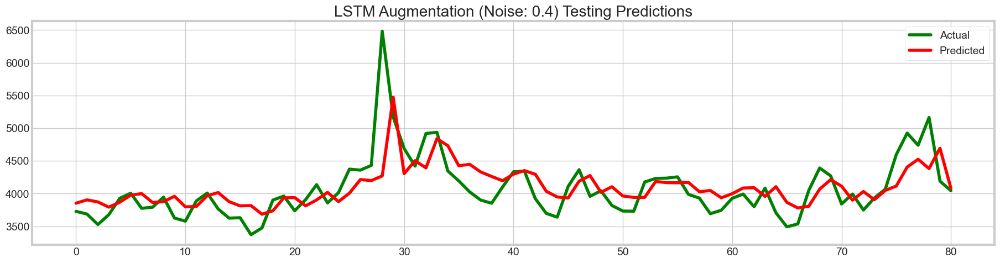

In [1201]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_noise1.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_noise1.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Augmentation (Noise: 0.4) Testing Predictions")
plt.legend()
plt.show()

In [1202]:
test_error_aug2 = smape(test_true_noise1.reshape(-1,1), test_pred_noise1.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_aug2}')

SMAPE
Test Error: 5.833149400086825


In [1203]:
noise_series3 = add_noise(english_df.values, noise_factor = 0.5)

In [1204]:
scaler = MinMaxScaler()
scaled_noise3 = scaler.fit_transform(noise_series3.reshape(-1, 1))

In [1205]:
noise_X1, noise_y1 = create_dataset(scaled_noise3.reshape(-1, 1), look_back = 10)

In [1206]:
trainSize_noisy1 = int(ceil(len(noise_X1) * 0.70))
valSize_noisy1 = int(ceil(len(noise_X1) * 0.85))

x_train_noise1 = noise_X1[0:trainSize_noisy1]
x_val_noise1 = noise_X1[trainSize_noisy1:valSize_noisy1]
x_test_noise1 = noise_X1[valSize_noisy1:]

In [1207]:
targetSize_noisy1 = int(ceil(len(noise_y1) * 0.70))
targetVal_noisy1 = int(ceil(len(noise_y1) * 0.85))

y_train_noise1 = noise_y1[0:targetSize_noisy1]
y_val_noise1 = noise_y1[targetSize_noisy1:targetVal_noisy1]
y_test_noise1 = noise_y1[targetVal_noisy1:]

In [1208]:
# Reshape the data for the lstm model
x_train_noise1 = np.reshape(x_train_noise1, (x_train_noise1.shape[0], 10, 1))
x_val_noise1 = np.reshape(x_val_noise1, (x_val_noise1.shape[0], 10, 1))
x_test_noise1 = np.reshape(x_test_noise1, (x_test_noise1.shape[0], 10, 1))

In [1209]:
model3_aug = Sequential([
    LSTM(20, input_shape = (10, 1), return_sequences=True),
    LSTM(10, return_sequences=False),
    Dense(1)
])

In [1210]:
model3_aug.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_absolute_error'])

In [1212]:
history3_aug = model3_aug.fit(x_train_noise1, y_train_noise1, validation_data=(x_val_noise1, y_val_noise1), epochs=20, batch_size=4)

Epoch 1/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0049 - mean_absolute_error: 0.0498 - val_loss: 0.0181 - val_mean_absolute_error: 0.1049
Epoch 2/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0046 - mean_absolute_error: 0.0478 - val_loss: 0.0159 - val_mean_absolute_error: 0.1002
Epoch 3/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0047 - mean_absolute_error: 0.0477 - val_loss: 0.0206 - val_mean_absolute_error: 0.1121
Epoch 4/20
95/95 [==============================] - 2s 20ms/step - loss: 0.0046 - mean_absolute_error: 0.0484 - val_loss: 0.0171 - val_mean_absolute_error: 0.1022
Epoch 5/20
95/95 [==============================] - 2s 18ms/step - loss: 0.0045 - mean_absolute_error: 0.0471 - val_loss: 0.0175 - val_mean_absolute_error: 0.1035
Epoch 6/20
95/95 [==============================] - 2s 19ms/step - loss: 0.0043 - mean_absolute_error: 0.0471 - val_loss: 0.0160 - val_mean_absolute_error: 0.0993
Epoch 7/20
95/95 [====

In [1213]:
y_pred_aug3 = model3_aug.predict(x_test_noise1)

3/3 [==============================] - 1s 5ms/step


In [1214]:
test_pred_noise3 = scaler.inverse_transform(y_pred_aug3)
test_true_noise3 = Scaler.inverse_transform([y_test_noise1])

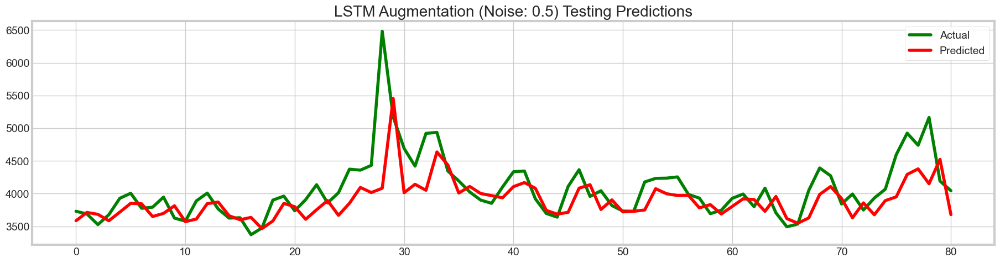

In [1215]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(test_true_noise3.reshape(-1,1), color='green', label='Actual')
predicted = plt.plot(test_pred_noise3.reshape(-1,1), color='red', label='Predicted')
plt.title("LSTM Augmentation (Noise: 0.5) Testing Predictions")
plt.legend()
plt.show()

In [1216]:
test_error_aug3 = smape(test_true_noise3.reshape(-1,1), test_pred_noise3.reshape(-1,1))

print('SMAPE')
print(f'Test Error: {test_error_aug3}')

SMAPE
Test Error: 5.994140998128581


In [1223]:
table4 = {
    "Augmentation Noise value": [
        "NA(Our Fit model value Error)", "0.1", "0.4", "0.5"
    ],
    "SMAPE Error": [
        "6.02", "6.49", "5.83", "5.99"
    ]
}

In [1232]:
table_df4 = pd.DataFrame(table4)

table_df4.to_csv("LSTM_aug1.csv", index=False)

# print("Taking Mean of all English pages data:")
pd.DataFrame(table_df4)

,Augmentation Noise value,SMAPE Error
0,NA(Our Fit model value Error),6.02
1,0.1,6.49
2,0.4,5.83
3,0.5,5.99


<br></br>
<h3>Step 5</h3>
<h3>Pre-trained Model:</h3>

**Using Fb Prophet to see the one year future predicts:**

In [59]:
from prophet import Prophet

In [60]:
model_fb = Prophet()

In [61]:
df_prophet = english_df.reset_index()
df_prophet.columns = ['ds', 'y']

In [62]:
df_prophet.head()

,ds,y
0,2015-07-01,2668.558717
1,2015-07-02,2641.819845
2,2015-07-03,2513.533870
3,2015-07-04,2614.326088
4,2015-07-05,2714.005393


In [63]:
model_fb.fit(df_prophet)

00:42:01 - cmdstanpy - INFO - Chain [1] start processing
00:42:01 - cmdstanpy - INFO - Chain [1] done processing


In [64]:
future_dates = model_fb.make_future_dataframe(periods=365)
forecast = model_fb.predict(future_dates)

In [65]:
plot_plotly(model_fb, forecast)

In [66]:
from prophet.plot import plot_components_plotly, plot_plotly

In [67]:
plot_components_plotly(model_fb, forecast)

**XGBoost:**

In [919]:
model_mean_xg = XGBRegressor(objective='reg:squarederror', n_estimators=1000)

In [923]:
xgTrain = int(ceil(len(en_X) * 0.70))
xgVal = int(ceil(len(en_X) * 0.85))

xgTrain_set = en_X[0:xgTrain]
xgVal_set = en_X[xgTrain:xgVal]
xgTest_set = en_X[xgVal:]

In [924]:
model_mean_xg.fit(xgTrain_set, y_train_en, eval_set=[(xgVal_set, y_val_en)], early_stopping_rounds=10)

[0]	validation_0-rmse:0.29884
[1]	validation_0-rmse:0.27565
[2]	validation_0-rmse:0.26238
[3]	validation_0-rmse:0.25228
[4]	validation_0-rmse:0.25018
[5]	validation_0-rmse:0.24868
[6]	validation_0-rmse:0.24633
[7]	validation_0-rmse:0.24447
[8]	validation_0-rmse:0.24483
[9]	validation_0-rmse:0.24223
[10]	validation_0-rmse:0.23989
[11]	validation_0-rmse:0.23815
[12]	validation_0-rmse:0.23710
[13]	validation_0-rmse:0.23559
[14]	validation_0-rmse:0.23538
[15]	validation_0-rmse:0.23436
[16]	validation_0-rmse:0.23332
[17]	validation_0-rmse:0.23246
[18]	validation_0-rmse:0.23238
[19]	validation_0-rmse:0.23184
[20]	validation_0-rmse:0.23243
[21]	validation_0-rmse:0.23260
[22]	validation_0-rmse:0.23224
[23]	validation_0-rmse:0.23301
[24]	validation_0-rmse:0.23296
[25]	validation_0-rmse:0.23274
[26]	validation_0-rmse:0.23300
[27]	validation_0-rmse:0.23308
[28]	validation_0-rmse:0.23279
[29]	validation_0-rmse:0.23279


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [925]:
y_predictions_xg = model_mean_xg.predict(xgTest_set)

In [926]:
y_predictions_xg

array([0.31311038, 0.3029867 , 0.26499006, 0.30836397, 0.41656047,
       0.45772433, 0.35820627, 0.29462752, 0.2983232 , 0.2872613 ,
       0.32612732, 0.35019138, 0.34480235, 0.3216264 , 0.31327963,
       0.36527407, 0.30299807, 0.21804474, 0.32149315, 0.361956  ,
       0.3260102 , 0.28676388, 0.31027237, 0.29393357, 0.27961335,
       0.29978198, 0.43635592, 0.31950623, 0.33772853, 0.33570006,
       0.31848678, 0.31721124, 0.26758936, 0.31848678, 0.31848678,
       0.27365878, 0.27365878, 0.26740026, 0.2704776 , 0.2704776 ,
       0.27636966, 0.27955085, 0.27731982, 0.26756626, 0.2786618 ,
       0.293622  , 0.32401314, 0.3145298 , 0.29414067, 0.3201963 ,
       0.25385043, 0.27388772, 0.37616017, 0.32862455, 0.31722328,
       0.31601495, 0.25683272, 0.29570225, 0.28281158, 0.36183214,
       0.3735427 , 0.31496888, 0.3039951 , 0.29079652, 0.28010905,
       0.26459312, 0.2791345 , 0.3306815 , 0.44625625, 0.2964237 ,
       0.32198203, 0.2935431 , 0.2830498 , 0.29426315, 0.33741

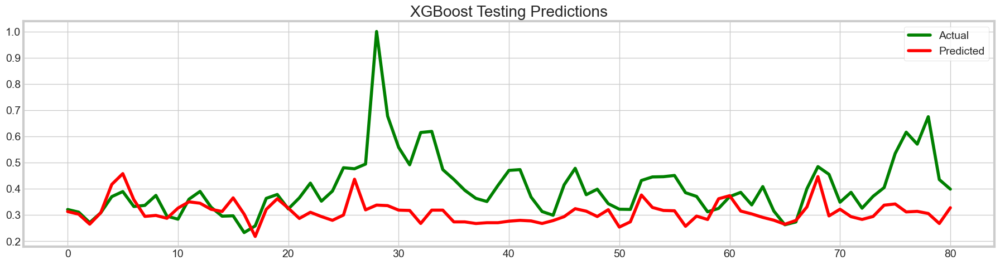

In [927]:
#Let's plot the predictions vs actual

plt.figure(figsize=(20, 5))
actual = plt.plot(y_test_en, color='green', label='Actual')
predicted = plt.plot(y_predictions_xg, color='red', label='Predicted')
plt.title("XGBoost Testing Predictions")
plt.legend()
plt.show()

In [929]:
test_error_mean = smape(y_test_en, y_predictions_xg)

print('SMAPE')
print(f'Test Error: {test_error_mean}')

SMAPE
Test Error: 25.895138975565153


In [1230]:
table5 = {
    "Model Type": [
        "LSTM 20*10, Dense with 1 neuron(Base Fit model)", "XGBoost"
    ],
    "SMAPE Error": [
        "6.02", "25.89" 
    ]
}

In [1231]:
table_df5 = pd.DataFrame(table5)

table_df5.to_csv("LSTM_models2.csv", index=False)

print("Pre-trained Model:")
pd.DataFrame(table_df5)

Pre-trained Model:


,Model Type,SMAPE Error
0,"LSTM 20*10, Dense with 1 neuron(Base Fit model)",6.02
1,XGBoost,25.89


<br></br>
<h3>Anomaly Detection:</h3>

In [157]:
true_values = test_true_inverseEN1.reshape(-1,1)
predictions_values = test_pred_inverseEN1.reshape(-1,1)

In [161]:
errors = np.abs(true_values - predictions_values)

# Compute the mean and standard deviation of errors
mean_error = np.mean(errors)
std_error = np.std(errors)

# Define a threshold to classify an anomaly
# Setting the threshold at two standard deviations strikes a balance between detecting genuine outliers and avoiding false positives.
threshold = mean_error + 2 * std_error

# Identify anomalies
anomalies = np.where(errors > threshold)[0]

# Print or visualize anomalies
print(f"Detected anomalies: {anomalies}")


Detected anomalies: [28 32 78]


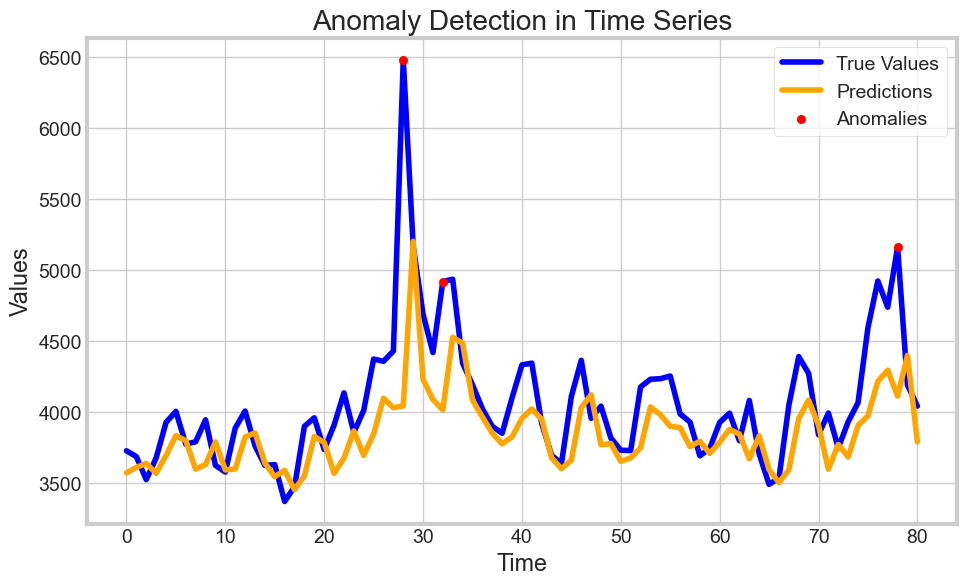

In [172]:
plt.figure(figsize=(10, 6))
plt.plot(true_values, label='True Values', color='blue')
plt.plot(predictions_values, label='Predictions', color='orange')
plt.scatter(anomalies, true_values[anomalies], color='red', label='Anomalies', zorder=2)
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()
plt.title('Anomaly Detection in Time Series')
plt.show()

<h3>Detecting Anomalies using IsolationForest</h3>

In [163]:
from sklearn.ensemble import IsolationForest

In [164]:
anomaly_data = english_df.values.reshape(-1, 1)

In [165]:
iso_forest = IsolationForest(contamination=0.05)

In [166]:
iso_forest.fit(anomaly_data)

IsolationForest(contamination=0.05)

In [167]:
predictions = iso_forest.predict(anomaly_data)
anomalies_iso = np.where(predictions == -1)[0]

In [168]:
print(f"Detected anomalies at indices: {anomalies_iso}")

Detected anomalies at indices: [  2  29  30  31  33  58 194 222 386 389 390 391 392 397 399 404 405 406
 408 409 410 411 426 427 428 497 499 546]


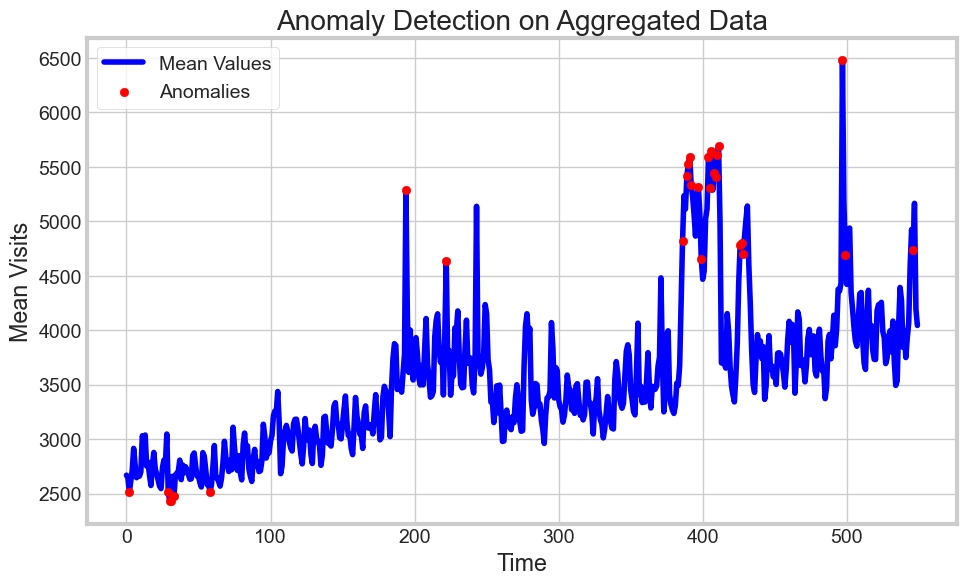

In [171]:
plt.figure(figsize=(10, 6))
plt.plot(anomaly_data, label='Mean Values', color='blue', zorder=1)
plt.scatter(anomalies_iso, anomaly_data[anomalies_iso], color='red', label='Anomalies', zorder=2)
plt.xlabel('Time')
plt.ylabel('Mean Visits')
plt.legend()
plt.title('Anomaly Detection on Aggregated Data')
plt.show()

**Finding Anomalies on only test set:**

In [174]:
errors_iso = np.abs(true_values - predictions_values)

In [175]:
errors_2d = errors_iso.reshape(-1, 1)

In [176]:
iso_forest1 = IsolationForest(contamination=0.05)

In [177]:
iso_forest1.fit(errors_2d)

IsolationForest(contamination=0.05)

In [178]:
predictions_if = iso_forest1.predict(errors_2d)
anomalies_iso1 = np.where(predictions_if == -1)[0]

In [179]:
print(f"Detected anomalies at indices: {anomalies_iso1}")

Detected anomalies at indices: [28 32 76 78]


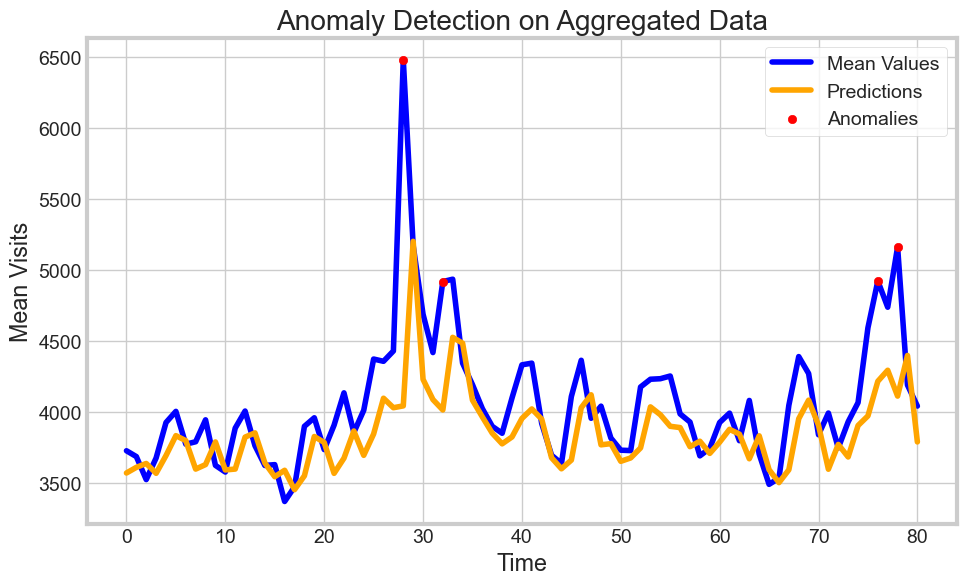

In [180]:
plt.figure(figsize=(10, 6))
plt.plot(true_values, label='Mean Values', color='blue')
plt.plot(predictions_values, label='Predictions', color='orange')
plt.scatter(anomalies_iso1, true_values[anomalies_iso1], color='red', label='Anomalies', zorder=2)
plt.xlabel('Time')
plt.ylabel('Mean Visits')
plt.legend()
plt.title('Anomaly Detection on Aggregated Data')
plt.show()

In [184]:
iso_forest_pred = IsolationForest(contamination=0.05)

# Fit the Isolation Forest model on the predicted values
iso_forest_pred.fit(predictions_values)

# Predict anomalies in predictions
predictions_anomalies = iso_forest_pred.predict(predictions_values)
anomalies_predictions = np.where(predictions_anomalies == -1)[0]

# Print detected anomalies in predictions
print(f"Detected anomalies in predictions at indices: {anomalies_predictions}")

Detected anomalies in predictions at indices: [17 29 33 34]


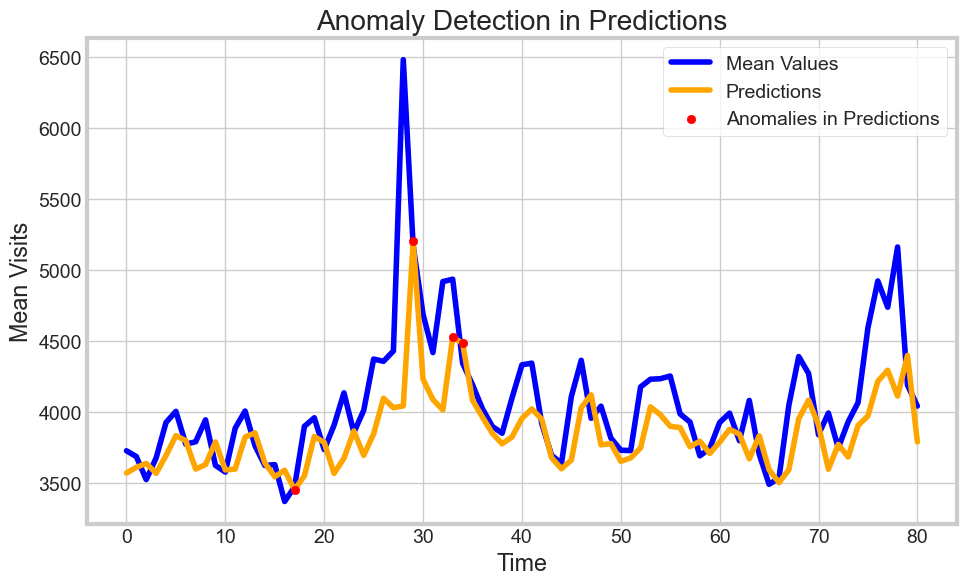

In [186]:
# Visualize anomalies in predictions
plt.figure(figsize=(10, 6))
plt.plot(true_values, label='Mean Values', color='blue')
plt.plot(predictions_values, label='Predictions', color='orange')
plt.scatter(anomalies_predictions, predictions_values[anomalies_predictions], color='red', label='Anomalies in Predictions', zorder=5)
plt.xlabel('Time')
plt.ylabel('Mean Visits')
plt.legend()
plt.title('Anomaly Detection in Predictions')
plt.show()